In [3]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

def plot_masks3(image, true_mask, pred_mask, tp_mask, fp_mask, fn_mask):
    # Create a figure and axes for plotting
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))

    # Plot the original image
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')

    # Function to overlay combined masks (green for true, red for pred, blue for intersection)
    def overlay_combined_mask(image, true_mask, pred_mask, opacity=0.5):
        # Ensure the image has 3 channels for RGB
        if image.ndim == 2:  # If grayscale, expand to 3 channels
            image_rgb = np.stack([image] * 3, axis=-1)
        else:
            image_rgb = image.copy()

        # Create color masks for true, pred, and intersection
        color_mask = np.zeros_like(image_rgb)
        
        # Where true_mask is 1 and pred_mask is 1 -> blue (intersection)
        color_mask[(true_mask == 1) & (pred_mask == 1)] = [0, 0, 255]  # Blue
        
        # Where true_mask is 1 and pred_mask is 0 -> green (true mask only)
        color_mask[(true_mask == 1) & (pred_mask == 0)] = [0, 255, 0]  # Green
        
        # Where pred_mask is 1 and true_mask is 0 -> red (pred mask only)
        color_mask[(true_mask == 0) & (pred_mask == 1)] = [255, 0, 0]  # Red

        # Overlay with opacity
        overlay_image = image_rgb.copy()
        mask_condition = (true_mask == 1) | (pred_mask == 1)
        overlay_image[mask_condition] = (1 - opacity) * image_rgb[mask_condition] + opacity * color_mask[mask_condition]

        return overlay_image

    # Plot the true and predicted masks concatenated, with intersection in blue
    combined_overlay = overlay_combined_mask(image, true_mask, pred_mask)
    axes[1].imshow(combined_overlay)
    axes[1].set_title('True Mask (Green), Pred Mask (Red), Intersection (Blue)')

    # Plot the true mask over the original image (green overlay where mask is white)
    true_overlay = overlay_combined_mask(image, true_mask, np.zeros_like(true_mask))
    axes[2].imshow(true_overlay)
    axes[2].set_title('True Mask (Overlay)')

    # Plot the predicted mask over the original image
    pred_overlay = overlay_combined_mask(image, np.zeros_like(pred_mask), pred_mask)
    axes[3].imshow(pred_overlay)
    axes[3].set_title('Predicted Mask (Overlay)')

    # Plot the true positives mask (where prediction and ground truth both match)
    tp_overlay = overlay_combined_mask(image, tp_mask, np.zeros_like(tp_mask))
    axes[4].imshow(tp_overlay)
    axes[4].set_title('True Positives (Overlay)')

    # Turn off axis for all subplots
    for ax in axes:
        ax.axis('off')

    # Show the figure
    plt.tight_layout()
    plt.show()

def plot_masks2(image, true_mask, pred_mask, tp_mask, fp_mask, fn_mask):
    # Create a figure and axes for plotting
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))

    # Plot the original image
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')

    # Function to overlay mask on the original image
    def overlay_mask(image, mask, color=(0, 255, 0), opacity=0.5):
        # Ensure the image has 3 channels for RGB
        if image.ndim == 2:  # If grayscale, expand to 3 channels
            image_rgb = np.stack([image] * 3, axis=-1)
        else:
            image_rgb = image.copy()

        # Create a color mask with the same shape as the image
        color_mask = np.zeros_like(image_rgb)
        color_mask[mask == 1] = color  # Apply green color where the mask is white

        # Overlay with opacity
        overlay_image = image_rgb.copy()
        overlay_image[mask == 1] = (1 - opacity) * image_rgb[mask == 1] + opacity * color_mask[mask == 1]

        return overlay_image

    # Plot the true mask over the original image (green overlay where mask is white)
    true_overlay = overlay_mask(image, true_mask, (0, 255, 0))
    axes[1].imshow(true_overlay)
    axes[1].set_title('True Mask (Overlay)')

    # Plot the predicted mask over the original image
    pred_overlay = overlay_mask(image, pred_mask, (255, 0, 0))
    axes[2].imshow(pred_overlay)
    axes[2].set_title('Predicted Mask (Overlay)')

    # Plot the true positives mask (where prediction and ground truth both match)
    tp_overlay = overlay_mask(image, tp_mask)
    axes[3].imshow(tp_overlay)
    axes[3].set_title('True Positives (Overlay)')

    # Plot the false positives/negatives mask
    fp_overlay = overlay_mask(image, fp_mask)
    axes[4].imshow(fp_overlay)
    axes[4].set_title('False Positives/Negatives (Overlay)')

    # Turn off axis for all subplots
    for ax in axes:
        ax.axis('off')

    # Show the figure
    plt.tight_layout()
    plt.show()

# Helper function to plot masks
def plot_masks(image, true_mask, pred_mask, tp_mask, fp_mask, fn_mask):
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')

    axes[1].imshow(true_mask, cmap='gray')
    axes[1].set_title('True Mask')

    axes[2].imshow(pred_mask, cmap='gray')
    axes[2].set_title('Predicted Mask')

    axes[3].imshow(tp_mask, cmap='gray')
    axes[3].set_title('True Positives')

    axes[4].imshow(fp_mask, cmap='gray')
    axes[4].set_title('False Positives & Negatives')

    for ax in axes:
        ax.axis('off')
    plt.show()

## Simulate a binary segmentation task
#def generate_example():
#    # Image size
#    image = np.zeros((100, 100))
#    
#    # True mask with two objects (trees)
#    true_mask = np.zeros_like(image)
#    true_mask[20:40, 20:40] = 1  # First tree
#    true_mask[60:80, 60:80] = 1  # Second tree
#    
#    # Predicted mask (with some error)
#    pred_mask = np.zeros_like(image)
#    pred_mask[22:38, 22:38] = 1  # First tree (slightly smaller)
#    pred_mask[62:78, 62:78] = 1  # Second tree (slightly smaller)
#    pred_mask[10:15, 10:15] = 1  # False positive (extra object)
#
#    return image, true_mask, pred_mask
#
## Object-wise metric calculation
def calculate_objectwise_metrics(true_mask, pred_mask):
    # Label connected components (objects) in both masks
    labeled_true = label(true_mask)
    labeled_pred = label(pred_mask)

    # Initialize true positives, false positives, and false negatives
    tp_mask = np.zeros_like(true_mask)
    fp_mask = np.zeros_like(true_mask)
    fn_mask = np.zeros_like(true_mask)

    # Match predicted objects with true objects using Intersection over Union (IoU)
    true_objects = np.unique(labeled_true)[1:]  # Exclude background (label 0)
    pred_objects = np.unique(labeled_pred)[1:]

    true_positive_count = 0
    false_positive_count = 0
    false_negative_count = 0

    for pred_obj in pred_objects:
        pred_obj_mask = labeled_pred == pred_obj
        iou_scores = []
        for true_obj in true_objects:
            true_obj_mask = labeled_true == true_obj
            intersection = np.logical_and(pred_obj_mask, true_obj_mask).sum()
            union = np.logical_or(pred_obj_mask, true_obj_mask).sum()
            iou = intersection / union if union > 0 else 0
            iou_scores.append(iou)

        max_iou = max(iou_scores) if iou_scores else 0
        if max_iou > 0.5:
            true_positive_count += 1
            tp_mask[pred_obj_mask] = 1
        else:
            false_positive_count += 1
            fp_mask[pred_obj_mask] = 1

    for true_obj in true_objects:
        true_obj_mask = labeled_true == true_obj
        if not np.logical_and(true_obj_mask, pred_mask).any():
            false_negative_count += 1
            fn_mask[true_obj_mask] = 1

    precision = true_positive_count / (true_positive_count + false_positive_count) if true_positive_count + false_positive_count > 0 else 0
    recall = true_positive_count / (true_positive_count + false_negative_count) if true_positive_count + false_negative_count > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

    return precision, recall, f1, tp_mask, fp_mask, fn_mask

# Main function to generate example and visualize
#def main():
#    image, true_mask, pred_mask = generate_example()
#    precision, recall, f1, tp_mask, fp_mask, fn_mask = calculate_objectwise_metrics(true_mask, pred_mask)
#
#    print(f'Precision: {precision:.2f}, Recall: {recall:.2f}, F1-score: {f1:.2f}')
#    
#    # Visualize
#    plot_masks(image, true_mask, pred_mask, tp_mask, fp_mask + fn_mask)
#
#if __name__ == '__main__':
#    main()


In [20]:
import os
import torch
import torch.nn.functional as F
from tqdm import tqdm
from models import biomed_UNet as UNet
from torch.utils.data import DataLoader
from models.biomed_UNet.datasets import ImageDataset
from models.biomed_UNet.unet_model import load_model

valid_set_path = '../data/2024-09-29-seg-dataset-200/val'
val_set = ImageDataset(valid_set_path)

batch_size = 1
lr = 1e-8
scale = 1
val = 0.1
amp = False
bilinear = False

#benchmark_model = UNet.from_pretrained(
#    'aerial-image-categorization/tree-detection_biomed-benchmark',
#    'cpu'
#)
model = UNet.model(UNet.config(n_channels=3, n_classes=2, bilinear=bilinear))
load_model(
    model,
    'checkpoints_unet-biomed-200-n1-200_2024-10-05_21-11/checkpoint_epoch15.pth',
    'cpu'
)

loader_args = dict(batch_size=batch_size, num_workers=os.cpu_count(), pin_memory=True)
#train_loader = DataLoader(train_set, shuffle=True, **loader_args)
val_loader = DataLoader(val_set, shuffle=False, drop_last=True, **loader_args)
for index, batch in enumerate(val_loader):
    if index == 1:
        image, mask_true = batch['image'], batch['mask']
        img_coords = batch['image_coords']

# move images and labels to correct device and type
image = image.to(device='cpu', dtype=torch.float32, memory_format=torch.channels_last)
mask_true = mask_true.to(device='cpu', dtype=torch.long)
# predict the mask
with torch.no_grad():
    mask_pred = model(image).cpu()
    
        
#if net.n_classes == 1:
#    assert mask_true.min() >= 0 and mask_true.max() <= 1, 'True mask indices should be in [0, 1]'
#    mask_pred = (torch.sigmoid(mask_pred) > 0.5).float()
#    # compute the Dice score
#    mask_true = mask_true.unsqueeze(1)
#    #print(mask_pred.shape)
#    #print(mask_true.shape)
#    
#    dice_score += dice_coeff(mask_pred, mask_true, reduce_batch_first=False)
#    
#    accuracy, precision, recall, f1 = calculate_pixelwise_classification_metrics(
#        mask_pred,
#        mask_true
#    )
#    total_px_accuracy += accuracy
#    total_px_precision += precision
#    total_px_recall += recall
#    total_px_f1 += f1
#    accuracy, precision, recall, f1 = calculate_objectwise_classification_metrics(
#        mask_pred.squeeze(1),
#        mask_true.squeeze(1),
#        threshold = 0.5
#    )
#        total_ob_accuracy += accuracy
#        total_ob_precision += precision
#        total_ob_recall += recall
#        total_ob_f1 += f1
#    else:
#        assert mask_true.min() >= 0 and mask_true.max() < net.n_classes, 'True mask indices should be in [0, n_classes['
#        # convert to one-hot format
#        mask_true = F.one_hot(mask_true, net.n_classes).permute(0, 3, 1, 2).float()
#        mask_pred = F.one_hot(mask_pred.argmax(dim=1), net.n_classes).permute(0, 3, 1, 2).float()
#        accuracy, precision, recall, f1 = calculate_pixelwise_classification_metrics(
#            mask_pred[:, 1:],
#            mask_true[:, 1:]
#        )
#        total_px_accuracy += accuracy
#        total_px_precision += precision
#        total_px_recall += recall
#        total_px_f1 += f1
#        accuracy, precision, recall, f1 = calculate_objectwise_classification_metrics2(
#            mask_pred[:, 1:],
#            mask_true[:, 1:],
#            threshold = 0.5
#        )
#        total_ob_accuracy += accuracy
#        total_ob_precision += precision
#        total_ob_recall += recall
#        total_ob_f1 += f1
#        # compute the Dice score, ignoring background
#        #dice_score += multiclass_dice_coeff(mask_pred[:, 1:], mask_true[:, 1:], reduce_batch_first=False)
#        dice_score += multiclass_jaccard_coeff(mask_pred[:, 1:], mask_true[:, 1:], reduce_batch_first=False)

In [103]:
mask_true

tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]])

In [104]:
mask_pred

tensor([[[[ 3.7194,  3.8401,  3.8805,  ...,  3.6561,  3.7093,  3.0655],
          [ 3.8188,  3.9612,  3.8362,  ...,  3.6385,  3.3482,  3.7098],
          [ 3.8629,  3.9416,  3.9317,  ...,  3.4127,  3.5360,  3.5233],
          ...,
          [ 3.8047,  3.9025,  3.7903,  ...,  3.7913,  3.8684,  3.6013],
          [ 3.8227,  3.9112,  3.8131,  ...,  3.8272,  3.9625,  3.4696],
          [ 3.7474,  3.8274,  3.8161,  ...,  3.7414,  3.6545,  3.5146]],

         [[-3.9735, -4.0215, -3.9868,  ..., -3.8737, -3.7037, -3.3482],
          [-3.9885, -4.0265, -3.9095,  ..., -3.8156, -3.8496, -3.8129],
          [-4.0093, -3.9981, -3.9158,  ..., -3.9624, -3.7831, -3.9625],
          ...,
          [-3.9707, -3.9660, -3.8906,  ..., -3.9384, -4.0053, -3.8266],
          [-4.0068, -4.0223, -3.9489,  ..., -4.0061, -4.0825, -3.7457],
          [-3.9338, -3.9742, -3.9792,  ..., -4.0058, -3.9409, -3.8331]]]])

In [21]:
import torch.nn.functional as F

#output = F.interpolate(mask_pred, (full_img.size[1], full_img.size[0]), mode='bilinear')
output = mask_pred
if model.n_classes > 1:
    mask = output.argmax(dim=1)
else:
    mask = torch.sigmoid(output) > out_threshold

mod_mask = mask[0].long().squeeze().numpy()
mod_mask.max()

1

In [245]:
s_mask_pred = (torch.sigmoid(mask_pred) > 0.5).float()
s_mask_pred

tensor([[[[1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          ...,
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]])

In [44]:
o_mask_pred = F.one_hot(mask_pred.argmax(dim=1), model.n_classes).permute(0, 3, 1, 2).float()
o_mask_pred

tensor([[[[1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          ...,
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]])

In [29]:
model.n_classes

2

In [ ]:
ImageDataset.preprocess([0,1], Image.fromarray(), scale, is_mask)

In [48]:
s_mask_pred = s_mask_pred[0].long().squeeze()#.numpy()
s_mask_pred

tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]])

In [74]:
mask_true.squeeze(0).numpy().shape

(200, 200)

In [72]:
mod_mask.shape

(200, 200)

In [60]:
s_mask_pred.long().numpy().shape

(1, 2, 200, 200)

In [23]:
precision, recall, f1, tp_mask, fp_mask, fn_mask = calculate_objectwise_metrics(
    mask_true.squeeze(0).numpy(),
    mod_mask
)

In [24]:
img_coords = [x.numpy()[0] for x in img_coords]

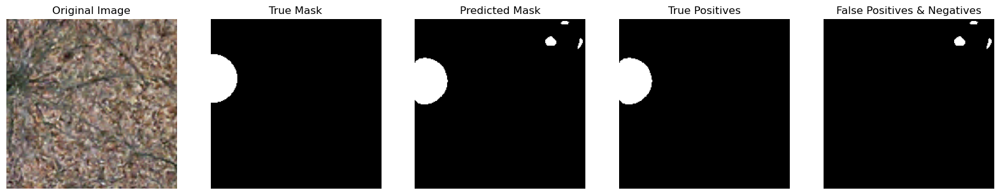

In [25]:
from PIL import Image
plot_masks(
    np.array(Image.open(f'../data/2024-09-29-seg-dataset-200/val/images/tile_tif_{img_coords[0]}_{img_coords[1]}.png')),
    mask_true.squeeze(0).numpy(),
    mod_mask,
    tp_mask,
    fp_mask,
    fn_mask
)

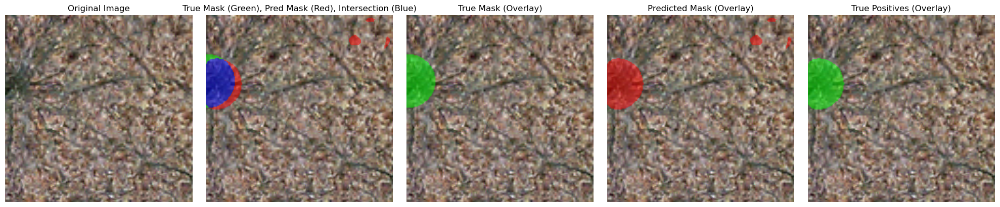

0.25 1.0 0.4


In [26]:
plot_masks3(
    np.array(Image.open(f'../data/2024-09-29-seg-dataset-200/val/images/tile_tif_{img_coords[0]}_{img_coords[1]}.png')),
    mask_true.squeeze(0).numpy(),
    mod_mask,
    tp_mask,
    fp_mask,
    fn_mask
)
print(precision, recall, f1)

In [140]:
precision

0.3333333333333333

In [141]:
recall

1.0

In [160]:
mod_mask.shape
mod_mask.dtype

dtype('uint8')

In [148]:
gray_image_array = np.full((100, 100), 128, dtype=np.int32)
gray_image_array.shape

(100, 100)

In [151]:
print("Original data type:", gray_image_array.dtype)

# Convert to uint8 if necessary
if mod_mask.dtype != np.uint8:
    mod_mask = mod_mask.astype(np.uint8)

Original data type: uint8


In [165]:
mod_mask.max()

1

In [ ]:
mod_mask.to

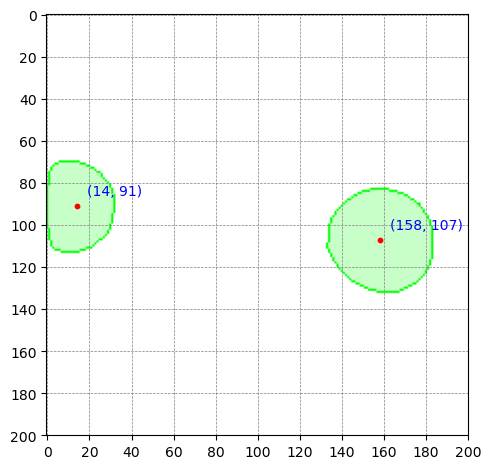

[(158, 107), (14, 91)]

In [16]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

def mask_to_image(mask: np.ndarray, mask_values):
    """
    Converts a mask to a PIL image using specified mask values.
    """
    if isinstance(mask_values[0], list):
        out = np.zeros((mask.shape[-2], mask.shape[-1], len(mask_values[0])), dtype=np.uint8)
    elif mask_values == [0, 1]:
        out = np.zeros((mask.shape[-2], mask.shape[-1]), dtype=bool)
    else:
        out = np.zeros((mask.shape[-2], mask.shape[-1]), dtype=np.uint8)

    if mask.ndim == 3:
        mask = np.argmax(mask, axis=0)

    for i, v in enumerate(mask_values):
        out[mask == i] = v

    return Image.fromarray(out)

def getPoints_fromPNG(img):
    """
    Processes an image to find contours, centroids, and plots the results.
    """
    # Convert image to RGB for consistent plotting
    out_img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    
    ## 1. Original Image
    #plt.figure(figsize=(15, 10))
    #plt.subplot(2, 3, 1)
    #plt.imshow(out_img)
    #plt.title('Original Image')
    #plt.axis('off')
#
    ## 2. Convert to Grayscale
    img_gray = img  # Since the input is already grayscale
    #plt.subplot(2, 3, 2)
    #plt.imshow(img_gray, cmap='gray')
    #plt.title('Grayscale Image')
    #plt.axis('off')
#
    ## 3. Thresholding to get Binary Image
    _, img_binary = cv2.threshold(img_gray, 200, 255, cv2.THRESH_BINARY)
    #plt.subplot(2, 3, 3)
    #plt.imshow(img_binary, cmap='gray')
    #plt.title('Binary Image')
    #plt.axis('off')
#
    ## 4. Find Contours
    contours, _ = cv2.findContours(img_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Create a copy of the image to draw contours
    img_contours = img_gray.copy()
    cv2.drawContours(out_img, contours, -1, (0, 255, 0), 1)  # Draw contours in green
    #plt.subplot(2, 3, 4)
    #plt.imshow(out_img)
    #plt.title('Contours')
    #plt.axis('off')

    # 5. Calculate centroids and mark them
    white_dot_centers = []
    for contour in contours:
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            white_dot_centers.append((cX, cY))
            #cv2.circle(out_img, (cX, cY), 2, (255, 0, 0), -1)  # Draw centroids in red

    # Set the background to white
    # Plot the image with contours and centroids
    #plt.subplot(2, 3, 5)
    green_color = np.array([200, 255, 200])  # Green color in RGB
    opacity = 0.99  # Define your opacity level (0 to 1)
    
    # Create a mask for white pixels
    white_mask = np.all(out_img == [255, 255, 255], axis=-1)
    out_img[white_mask] = (1 - opacity) * out_img[white_mask] + opacity * green_color
    
    out_img[np.all(out_img == [0, 0, 0], axis=-1)] = [255, 255, 255]
    plt.imshow(out_img)
    
    # Mark the centroids and label them
    for (x, y) in white_dot_centers:
        plt.scatter(x, y, color='red', marker='o', s=10)  # Mark the center
        plt.text(x + 5, y - 5, f'({x}, {y})', color='blue', fontsize=10)
    
    # Add grid and custom ticks
    plt.grid(True, which='both', color='gray', linestyle='--', linewidth=0.5)
    ticks = np.arange(0, 201, 20)
    plt.xticks(ticks)
    plt.yticks(ticks)
    # Invert y-axis to start from bottom
    #plt.gca().invert_yaxis()

    #plt.title('Contours with Centroids and Grid')
    plt.axis('on')

    plt.tight_layout()
    plt.show()

    return white_dot_centers

# Example Usage
pil_image = mask_to_image(
    mask=mod_mask,  # Replace `mod_mask` with your actual mask data
    mask_values=[0, 255]
)

image_array = np.array(pil_image)

# Convert to OpenCV image (if not already)
if len(image_array.shape) == 3 and image_array.shape[2] == 3:  # Check if the image has 3 channels
    cv2_image = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)
else:
    cv2_image = image_array 

getPoints_fromPNG(cv2_image)


In [64]:
import torch
from torch import Tensor
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
def dice_coeff(input: Tensor, target: Tensor, reduce_batch_first: bool = False, epsilon: float = 1e-6):
    # Average of Dice coefficient for all batches, or for a single mask
    assert input.size() == target.size()
    assert input.dim() == 3 or not reduce_batch_first

    sum_dim = (-1, -2) if input.dim() == 2 or not reduce_batch_first else (-1, -2, -3)

    inter = 2 * (input * target).sum(dim=sum_dim)
    sets_sum = input.sum(dim=sum_dim) + target.sum(dim=sum_dim)
    sets_sum = torch.where(sets_sum == 0, inter, sets_sum)

    dice = (inter + epsilon) / (sets_sum + epsilon)
    return dice.mean()


def multiclass_dice_coeff(input: Tensor, target: Tensor, reduce_batch_first: bool = False, epsilon: float = 1e-6):
    # Average of Dice coefficient for all classes
    return dice_coeff(input.flatten(0, 1), target.flatten(0, 1), reduce_batch_first, epsilon)

In [31]:
multiclass_dice_coeff(F.one_hot(mask_pred.argmax(dim=1), model.n_classes).permute(0, 3, 1, 2).float(), F.one_hot(mask_true, model.n_classes).permute(0, 3, 1, 2).float(), reduce_batch_first=False)

tensor(0.8948)

In [38]:
dice_coeff(
    mask_pred.argmax(dim=1)[0].long().squeeze(),
    mask_true.squeeze(0),
    reduce_batch_first=False)

dice_coeff(
    F.one_hot(mask_pred.argmax(dim=1), model.n_classes).permute(0, 3, 1, 2).float().flatten(0, 1),
    F.one_hot(mask_true, model.n_classes).permute(0, 3, 1, 2).float().flatten(0, 1),
    reduce_batch_first=False
)

tensor(0.8948)

tensor(0.8948)

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

# Synthetic example size
height, width = 10, 10
n_classes = 2  # Binary classification

# Generate random predicted mask and true mask
np.random.seed(0)  # For reproducibility
mask_true = np.random.randint(0, n_classes, size=(height, width)).astype(np.int64)  # True mask
mask_pred = np.random.rand(height, width, n_classes)  # Random probabilities for each class
mask_pred = np.argmax(mask_pred, axis=-1)  # Predicted mask (class indices)

# Convert to PyTorch tensors
mask_true_tensor = torch.tensor(mask_true).unsqueeze(0)  # Shape [1, H, W]
mask_pred_tensor = torch.tensor(mask_pred).unsqueeze(0)  # Shape [1, H, W]

# Method 1: Direct comparison
dice_coeff_1 = dice_coeff(
    mask_pred_tensor[0].long().squeeze(),  # Shape [H, W]
    mask_true_tensor.squeeze(0),  # Shape [H, W]
    reduce_batch_first=False
)

# Method 2: One-hot encoding
mask_pred_one_hot = F.one_hot(mask_pred_tensor.argmax(dim=1), n_classes).permute(0, 3, 1, 2).float()
mask_true_one_hot = F.one_hot(mask_true_tensor, n_classes).permute(0, 3, 1, 2).float()

dice_coeff_2 = dice_coeff(
    mask_pred_one_hot.flatten(0, 1),  # Shape [1 * n_classes, H * W]
    mask_true_one_hot.flatten(0, 1),  # Shape [1 * n_classes, H * W]
    reduce_batch_first=False
)

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot true mask
axes[0].imshow(mask_true, cmap='gray', interpolation='nearest')
axes[0].set_title("True Mask")
axes[0].axis("off")

# Plot predicted mask
axes[1].imshow(mask_pred, cmap='gray', interpolation='nearest')
axes[1].set_title("Predicted Mask")
axes[1].axis("off")

# Plot Dice coefficients
axes[2].bar(["Method 1", "Method 2"], [dice_coeff_1.item(), dice_coeff_2.item()])
axes[2].set_title("Dice Coefficient Comparison")
axes[2].set_ylabel("Dice Coefficient")

plt.tight_layout()
plt.show()


RuntimeError: Class values must be smaller than num_classes.

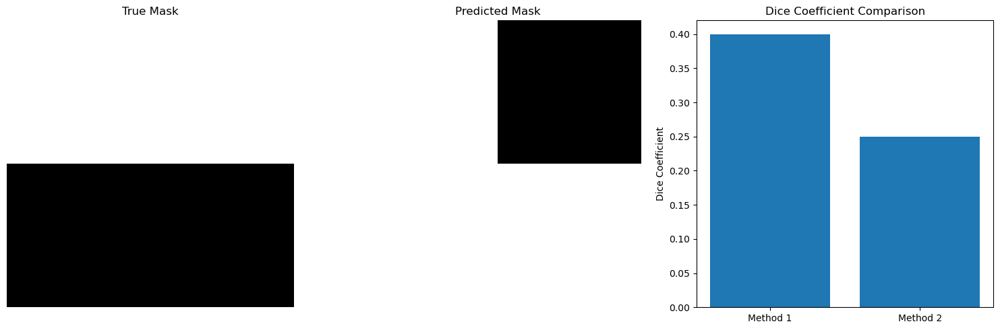

[0.40000012516975403, 0.25000008940696716]


In [49]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

# Synthetic example size
height, width = 2, 2
n_classes = 2  # Binary classification

# Generate random predicted mask and true mask
np.random.seed(1)  # For reproducibility
mask_true = np.random.randint(0, n_classes, size=(height, width)).astype(np.int64)  # True mask
mask_pred_prob = np.random.rand(height, width, n_classes)  # Random probabilities for each class
mask_pred = np.argmax(mask_pred_prob, axis=-1)  # Predicted mask (class indices)

# Convert to PyTorch tensors
mask_true_tensor = torch.tensor(mask_true).unsqueeze(0)  # Shape [1, H, W]
mask_pred_tensor = torch.tensor(mask_pred).unsqueeze(0)  # Shape [1, H, W]

# Method 1: Direct comparison
dice_coeff_1 = dice_coeff(
    mask_pred_tensor[0].long().squeeze(),  # Shape [H, W]
    mask_true_tensor.squeeze(0),  # Shape [H, W]
    reduce_batch_first=False
)

# Method 2: One-hot encoding
# Correcting the one-hot encoding step
mask_pred_one_hot = F.one_hot(mask_pred_tensor[0], n_classes).float()  # Shape [H, W, n_classes]
mask_true_one_hot = F.one_hot(mask_true_tensor[0], n_classes).float()  # Shape [H, W, n_classes]

# Now permute to get to shape [n_classes, H, W]
mask_pred_one_hot = mask_pred_one_hot.permute(2, 0, 1)  # Shape [n_classes, H, W]
mask_true_one_hot = mask_true_one_hot.permute(2, 0, 1)  # Shape [n_classes, H, W]

# Flattening the masks for Dice calculation
dice_coeff_2 = dice_coeff(
    mask_pred_one_hot.flatten(0, 1),  # Shape [n_classes, H*W]
    mask_true_one_hot.flatten(0, 1),  # Shape [n_classes, H*W]
    reduce_batch_first=False
)

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot true mask
axes[0].imshow(mask_true, cmap='gray', interpolation='nearest')
axes[0].set_title("True Mask")
axes[0].axis("off")

# Plot predicted mask
axes[1].imshow(mask_pred, cmap='gray', interpolation='nearest')
axes[1].set_title("Predicted Mask")
axes[1].axis("off")

# Plot Dice coefficients
axes[2].bar(["Method 1", "Method 2"], [dice_coeff_1.item(), dice_coeff_2.item()])
axes[2].set_title("Dice Coefficient Comparison")
axes[2].set_ylabel("Dice Coefficient")

plt.tight_layout()
plt.show()
print([dice_coeff_1.item(), dice_coeff_2.item()])

In [50]:
mask_true = np.random.randint(0, n_classes, size=(height, width)).astype(np.int64)

In [51]:
mask_true.shape

(2, 2)

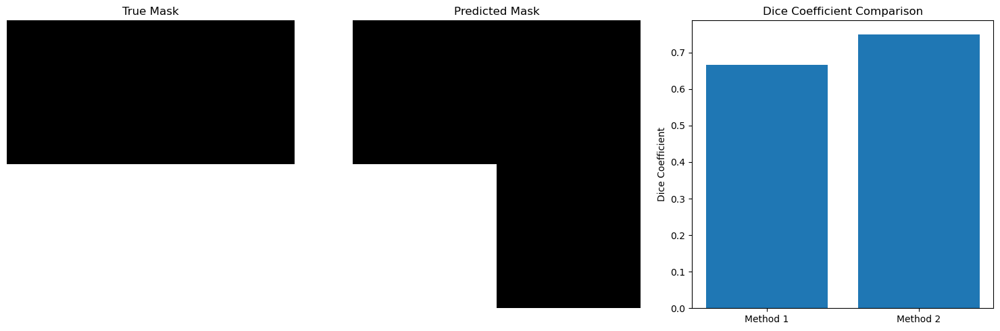

[0.6666667461395264, 0.75]


In [67]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

# Synthetic example size
height, width = 2, 2
n_classes = 2  # Binary classification

# Generate random predicted mask and true mask
mask_true_i = np.array([[0,0],
                        [1,1]])
mask_pred_i = np.array([[0,0],
                        [1,0]])
mask_true = mask_true_i
mask_pred = mask_pred_i  # Predicted mask (class indices)

# Convert to PyTorch tensors
mask_true_tensor = torch.tensor(mask_true).unsqueeze(0)  # Shape [1, H, W]
mask_pred_tensor = torch.tensor(mask_pred).unsqueeze(0)  # Shape [1, H, W]

# Method 1: Direct comparison
dice_coeff_1 = dice_coeff(
    mask_pred_tensor[0].long().squeeze(),  # Shape [H, W]
    mask_true_tensor.squeeze(0),  # Shape [H, W]
    reduce_batch_first=False
)

# Method 2: One-hot encoding
# Correcting the one-hot encoding step
mask_pred_one_hot = F.one_hot(mask_pred_tensor[0], n_classes).float()  # Shape [H, W, n_classes]
mask_true_one_hot = F.one_hot(mask_true_tensor[0], n_classes).float()  # Shape [H, W, n_classes]

# Now permute to get to shape [n_classes, H, W]
mask_pred_one_hot = mask_pred_one_hot.permute(2, 0, 1)  # Shape [n_classes, H, W]
mask_true_one_hot = mask_true_one_hot.permute(2, 0, 1)  # Shape [n_classes, H, W]

# Flattening the masks for Dice calculation
dice_coeff_2 = dice_coeff(
    mask_pred_one_hot.flatten(0, 1),  # Shape [n_classes, H*W]
    mask_true_one_hot.flatten(0, 1),  # Shape [n_classes, H*W]
    reduce_batch_first=False
)

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot true mask
axes[0].imshow(mask_true, cmap='gray', interpolation='nearest')
axes[0].set_title("True Mask")
axes[0].axis("off")

# Plot predicted mask
axes[1].imshow(mask_pred, cmap='gray', interpolation='nearest')
axes[1].set_title("Predicted Mask")
axes[1].axis("off")

# Plot Dice coefficients
axes[2].bar(["Method 1", "Method 2"], [dice_coeff_1.item(), dice_coeff_2.item()])
axes[2].set_title("Dice Coefficient Comparison")
axes[2].set_ylabel("Dice Coefficient")

plt.tight_layout()
plt.show()
print([dice_coeff_1.item(), dice_coeff_2.item()])

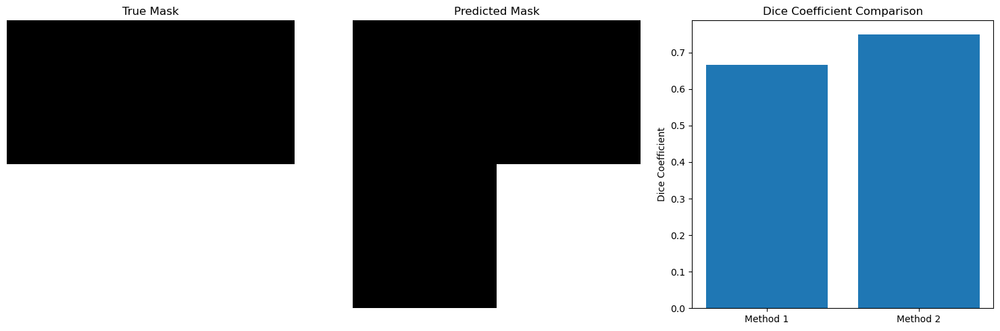

IoU Score: 0.5
Dice Coefficients: [0.6666667461395264, 0.75]


RuntimeError: number of dims don't match in permute

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

# Synthetic example size
height, width = 2, 2
n_classes = 2  # Binary classification

# Generate random predicted mask and true mask
mask_true_i = np.array([[0,0],
                        [1,1]])
mask_pred_i = np.array([[0,0],
                        [0,1]])
mask_true = mask_true_i
mask_pred = mask_pred_i  # Predicted mask (class indices)

# Convert to PyTorch tensors
mask_true_tensor = torch.tensor(mask_true).unsqueeze(0)  # Shape [1, H, W]
mask_pred_tensor = torch.tensor(mask_pred).unsqueeze(0)  # Shape [1, H, W]

# IoU calculation
def calculate_iou(mask_true, mask_pred):
    intersection = torch.sum((mask_true == 1) & (mask_pred == 1)).item()
    union = torch.sum((mask_true == 1) | (mask_pred == 1)).item()
    iou = intersection / union if union > 0 else 0  # Avoid division by zero
    return iou

# Calculate IoU
iou_score = calculate_iou(mask_true_tensor[0], mask_pred_tensor[0])


# Method 1: Direct comparison
dice_coeff_1 = dice_coeff(
    mask_pred_tensor[0].long().squeeze(),  # Shape [H, W]
    mask_true_tensor.squeeze(0),  # Shape [H, W]
    reduce_batch_first=False
)

# Method 2: One-hot encoding
# Correcting the one-hot encoding step
mask_pred_one_hot = F.one_hot(mask_pred_tensor[0], n_classes).float()  # Shape [H, W, n_classes]
mask_true_one_hot = F.one_hot(mask_true_tensor[0], n_classes).float()  # Shape [H, W, n_classes]

# Now permute to get to shape [n_classes, H, W]
mask_pred_one_hot = mask_pred_one_hot.permute(2, 0, 1)  # Shape [n_classes, H, W]
mask_true_one_hot = mask_true_one_hot.permute(2, 0, 1)  # Shape [n_classes, H, W]

# Flattening the masks for Dice calculation
dice_coeff_2 = dice_coeff(
    mask_pred_one_hot.flatten(0, 1),  # Shape [n_classes, H*W]
    mask_true_one_hot.flatten(0, 1),  # Shape [n_classes, H*W]
    reduce_batch_first=False
)

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot true mask
axes[0].imshow(mask_true, cmap='gray', interpolation='nearest')
axes[0].set_title("True Mask")
axes[0].axis("off")

# Plot predicted mask
axes[1].imshow(mask_pred, cmap='gray', interpolation='nearest')
axes[1].set_title("Predicted Mask")
axes[1].axis("off")

# Plot Dice coefficients
axes[2].bar(["Method 1", "Method 2"], [dice_coeff_1.item(), dice_coeff_2.item()])
axes[2].set_title("Dice Coefficient Comparison")
axes[2].set_ylabel("Dice Coefficient")

plt.tight_layout()
plt.show()

# Output IoU and Dice scores
print("IoU Score:", iou_score)
print("Dice Coefficients:", [dice_coeff_1.item(), dice_coeff_2.item()])
mask_true_old = F.one_hot(torch.tensor(mask_true), 3).permute(0, 3, 1, 2).float()
mask_pred_old = F.one_hot(torch.tensor(mask_pred).argmax(dim=1), 3).permute(0, 3, 1, 2).float()
dice_coeff(
    mask_pred_old.flatten(0, 1),  # Shape [n_classes, H*W]
    mask_true_old.flatten(0, 1),  # Shape [n_classes, H*W]
    reduce_batch_first=False
)


In [93]:
mask_pred.shape

torch.Size([1, 2, 200, 200])

In [89]:
mask_pred[0,0]

tensor([[3.5449, 3.5504, 3.7661,  ..., 3.9596, 3.9267, 3.7179],
        [3.1955, 3.5372, 3.3304,  ..., 3.8762, 3.9162, 3.8575],
        [3.4098, 3.3557, 3.6198,  ..., 3.8156, 3.8772, 3.8616],
        ...,
        [3.4369, 3.7052, 3.6073,  ..., 3.8500, 3.8671, 3.4431],
        [3.4304, 3.3222, 3.5888,  ..., 3.6344, 3.9133, 3.3976],
        [2.8455, 3.2668, 3.2761,  ..., 3.5983, 3.5464, 3.5642]])

In [90]:
mask_true_old = F.one_hot(mask_true, 2).permute(0, 3, 1, 2).float()
mask_pred_old = F.one_hot(mask_pred.argmax(dim=1), 2).permute(0, 3, 1, 2).float()
dice_coeff(
    mask_pred_old.flatten(0, 1),  # Shape [n_classes, H*W]
    mask_true_old.flatten(0, 1),  # Shape [n_classes, H*W]
    reduce_batch_first=False
)

tensor(0.8948)

In [91]:
mask_true_i = np.array(
    [
        [
            [0,0],
            [1,1]
        ],
        [
            [0,0],
            [0,0]
        ]
    ]
)
mask_pred_i = np.array(
    [
        [
            [0,0],
            [1,0]
        ],
        [
            [0,0],
            [0,0]
        ]
    ]
)

In [95]:
mask_true_i = torch.tensor(mask_true_i).unsqueeze(0)
mask_pred_i = torch.tensor(mask_pred_i).unsqueeze(0)

In [96]:
mask_true_old = F.one_hot(mask_true_i, 2).permute(0, 3, 1, 2).float()
mask_pred_old = F.one_hot(mask_pred_i.argmax(dim=1), 2).permute(0, 3, 1, 2).float()
dice_coeff(
    mask_pred_old.flatten(0, 1),  # Shape [n_classes, H*W]
    mask_true_old.flatten(0, 1),  # Shape [n_classes, H*W]
    reduce_batch_first=False
)

RuntimeError: number of dims don't match in permute

In [97]:
import torch
import torch.nn.functional as F

# Assuming mask_true_i and mask_pred_i are defined as before
mask_true_i = torch.tensor(
    [
        [0, 0],
        [1, 1]
    ]
)
mask_pred_i = torch.tensor(
    [
        [0, 1],
        [1, 1]
    ]
)

# One-hot encode the masks
mask_true_old = F.one_hot(mask_true_i, 2)  # Shape [H, W, num_classes]
mask_pred_old = F.one_hot(mask_pred_i, 2)  # Shape [H, W, num_classes]

# Correctly permute to [num_classes, H, W]
mask_true_old = mask_true_old.permute(2, 0, 1).float()  # Shape: [num_classes, H, W]
mask_pred_old = mask_pred_old.permute(2, 0, 1).float()  # Shape: [num_classes, H, W]

# You can then use these in your dice coefficient calculation
dice_coeff_value = dice_coeff(
    mask_pred_old.flatten(0, 1),  # Shape [num_classes, H*W]
    mask_true_old.flatten(0, 1),  # Shape [num_classes, H*W]
    reduce_batch_first=False
)

print("Dice Coefficient:", dice_coeff_value)


Dice Coefficient: tensor(0.7500)


In [98]:
# Convert to PyTorch tensors
mask_true_tensor = torch.tensor(mask_true_i).unsqueeze(0)  # Shape [1, H, W]
mask_pred_tensor = torch.tensor(mask_pred_i).unsqueeze(0)  # Shape [1, H, W]

# Method 1: Direct comparison
dice_coeff_1 = dice_coeff(
    mask_pred_tensor[0].long().squeeze(),  # Shape [H, W]
    mask_true_tensor.squeeze(0),  # Shape [H, W]
    reduce_batch_first=False
)

/tmp/ipykernel_325003/3480710178.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask_true_tensor = torch.tensor(mask_true_i).unsqueeze(0)  # Shape [1, H, W]
/tmp/ipykernel_325003/3480710178.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask_pred_tensor = torch.tensor(mask_pred_i).unsqueeze(0)  # Shape [1, H, W]


In [99]:
dice_coeff_1

tensor(0.8000)

/home/ubuntu/miniconda3/envs/canopyseg/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


FileNotFoundError: [Errno 2] No such file or directory: 'mask_pred.png'

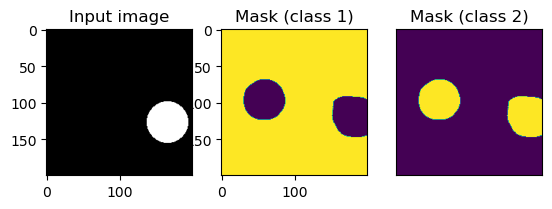

IoU: 0.28108295798301697
c. metrics: (0.5, 0.5, 1.0, 0.6666666666666666, array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=int32), array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=int32), array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=int32))


In [32]:
import os
import torch
import torch.nn.functional as F
from tqdm import tqdm
from models import biomed_UNet as UNet
from torch.utils.data import DataLoader
from models.my_UNet.datasets import ImageDataset
from models.my_UNet.unet_model import load_model
from models.my_UNet.predict import predict_img, mask_to_image, plot_img_and_mask
import numpy as np
import cv2
#from models.my_UNet.scores import calculate_objectwise_classification_metrics2, iou, calculate_objectwise_classification_metrics
from PIL import Image


model = UNet.model(UNet.config(n_channels=3, n_classes=1, bilinear=False))
load_model(
    model,
    'checkpoints_MyUNet-1_2024-10-06_23-49/checkpoint_epoch50.pth',
    'cpu'
)

index = '9_71'
full_img = Image.open(f'../data/2024-09-29-seg-dataset-200/val/images/tile_tif_{index}.png')
true_mask = Image.open(f'../data/2024-09-29-seg-dataset-200/val/masks/tile_shp_{index}.png')
pred = predict_img(
    net = model,
    full_img = full_img,
    device = 'cpu',
    scale_factor=1,
    out_threshold=0.5
)
plot_img_and_mask(true_mask, pred)

true_tensor = (torch.tensor(cv2.cvtColor(np.array(true_mask), cv2.COLOR_RGB2GRAY)).unsqueeze(0) == 255).int()
pred_tensor = torch.tensor(pred).unsqueeze(0)
print(f'''IoU: {iou(true_tensor,pred_tensor)}
c. metrics: {calculate_objectwise_classification_metrics2(pred_tensor,true_tensor, threshold = 0.49)}''')



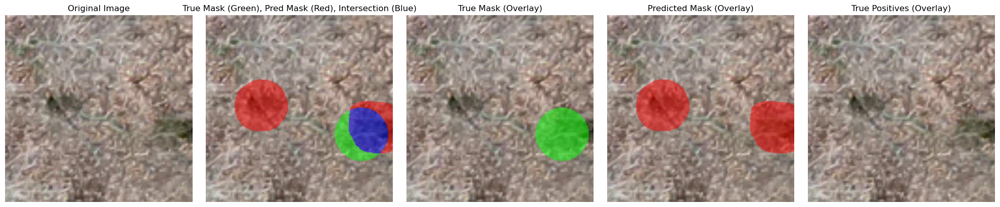

0.0 0 0


In [19]:
precision, recall, f1, tp_mask, fp_mask, fn_mask = calculate_objectwise_metrics(
    true_tensor.squeeze(0).numpy(),
    pred_tensor.squeeze(0).numpy()
)
precision, recall, f1

plot_masks3(
    np.array(full_img),
    true_tensor.squeeze(0).numpy(),
    pred_tensor.squeeze(0).numpy(),
    tp_mask,
    fp_mask,
    fn_mask
)
print(precision, recall, f1)

In [29]:
def calculate_objectwise_classification_metrics2(mask_pred, mask_true, threshold = 0.5):
    pred_mask = mask_pred.cpu().numpy()
    true_mask = mask_true.cpu().numpy()
    # Label connected components (objects) in both masks
    labeled_true = label(true_mask)
    labeled_pred = label(pred_mask)

    # Initialize true positives, false positives, and false negatives
    tp_mask = np.zeros_like(true_mask)
    fp_mask = np.zeros_like(true_mask)
    fn_mask = np.zeros_like(true_mask)

    # Match predicted objects with true objects using Intersection over Union (IoU)
    true_objects = np.unique(labeled_true)[1:]  # Exclude background (label 0)
    pred_objects = np.unique(labeled_pred)[1:]

    true_positive_count = 0
    false_positive_count = 0
    false_negative_count = 0

    for pred_obj in pred_objects:
        pred_obj_mask = labeled_pred == pred_obj
        iou_scores = []
        for true_obj in true_objects:
            true_obj_mask = labeled_true == true_obj
            intersection = np.logical_and(pred_obj_mask, true_obj_mask).sum()
            union = np.logical_or(pred_obj_mask, true_obj_mask).sum()
            iou = intersection / union if union > 0 else 0
            iou_scores.append(iou)

        max_iou = max(iou_scores) if iou_scores else 0
        if max_iou > threshold:
            true_positive_count += 1
            tp_mask[pred_obj_mask] = 1
        else:
            false_positive_count += 1
            fp_mask[pred_obj_mask] = 1

    for true_obj in true_objects:
        true_obj_mask = labeled_true == true_obj
        if not np.logical_and(true_obj_mask, pred_mask).any():
            false_negative_count += 1
            fn_mask[true_obj_mask] = 1
            
    accuracy = true_positive_count / (true_positive_count + false_positive_count + false_negative_count) if (true_positive_count + false_positive_count + false_negative_count) > 0 else 0
    precision = true_positive_count / (true_positive_count + false_positive_count) if true_positive_count + false_positive_count > 0 else 0
    recall = true_positive_count / (true_positive_count + false_negative_count) if true_positive_count + false_negative_count > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

    return accuracy, precision, recall, f1, tp_mask, fp_mask, fn_mask


In [20]:
def calculate_objectwise_metrics(true_mask, pred_mask):
    # Label connected components (objects) in both masks
    labeled_true = label(true_mask)
    labeled_pred = label(pred_mask)

    # Initialize true positives, false positives, and false negatives
    tp_mask = np.zeros_like(true_mask)
    fp_mask = np.zeros_like(true_mask)
    fn_mask = np.zeros_like(true_mask)

    # Match predicted objects with true objects using Intersection over Union (IoU)
    true_objects = np.unique(labeled_true)[1:]  # Exclude background (label 0)
    pred_objects = np.unique(labeled_pred)[1:]

    true_positive_count = 0
    false_positive_count = 0
    false_negative_count = 0

    for pred_obj in pred_objects:
        pred_obj_mask = labeled_pred == pred_obj
        iou_scores = []
        for true_obj in true_objects:
            true_obj_mask = labeled_true == true_obj
            intersection = np.logical_and(pred_obj_mask, true_obj_mask).sum()
            union = np.logical_or(pred_obj_mask, true_obj_mask).sum()
            iou = intersection / union if union > 0 else 0
            iou_scores.append(iou)

        max_iou = max(iou_scores) if iou_scores else 0
        if max_iou > 0.5:
            true_positive_count += 1
            tp_mask[pred_obj_mask] = 1
        else:
            false_positive_count += 1
            fp_mask[pred_obj_mask] = 1

    for true_obj in true_objects:
        true_obj_mask = labeled_true == true_obj
        if not np.logical_and(true_obj_mask, pred_mask).any():
            false_negative_count += 1
            fn_mask[true_obj_mask] = 1


    precision = true_positive_count / (true_positive_count + false_positive_count) if true_positive_count + false_positive_count > 0 else 0
    recall = true_positive_count / (true_positive_count + false_negative_count) if true_positive_count + false_negative_count > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

    return accuracy, precision, recall, f1, tp_mask, fp_mask, fn_mask


In [16]:
def calculate_objectwise_classification_metrics2(mask_pred, mask_true, threshold=0.5):
    """
    Calculate objectwise precision, recall, F1 score, and accuracy for multi-class segmentation
    ignoring the background (class 0).
    """
    mask_pred_np = mask_pred.cpu().numpy()
    mask_true_np = mask_true.cpu().numpy()

    pred_labeled, num_pred = label(mask_pred_np)
    true_labeled, num_true = label(mask_true_np)

    TP = 0  # True positives: correctly predicted objects
    FP = 0  # False positives: predicted objects that don't match any true object
    FN = 0  # False negatives: true objects that don't have any matching prediction

    matched_true_objects = set()  # Keep track of matched true objects

    pred_objects = np.unique(pred_labeled)
    true_objects = np.unique(true_labeled)

    for pred_obj in pred_objects:
        if pred_obj == 0:  # Skip background
            continue

        pred_mask = (pred_labeled == pred_obj)
        best_iou = 0
        best_true_obj = None
        
        for true_obj in true_objects:
            if true_obj == 0:
                continue

            true_mask = (true_labeled == true_obj)
            intersection = np.logical_and(pred_mask, true_mask).sum()
            union = np.logical_or(pred_mask, true_mask).sum()

            iou = intersection / union if union > 0 else 0

            if iou > best_iou:
                best_iou = iou
                best_true_obj = true_obj

        if best_iou > threshold:
            TP += 1
            matched_true_objects.add(best_true_obj)
        else:
            FP += 1

    FN = len(true_objects) - 1 - len(matched_true_objects)

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    accuracy = TP / (TP + FP + FN) if (TP + FP + FN) > 0 else 0

    return accuracy, precision, recall, f1

# Segmentation: Drop biased image-mask pairs

In [11]:
import os
import shutil
from PIL import Image
import numpy as np
from tqdm import tqdm

def copy_masks_with_white_pixels(src_folder, dest_folder, radius):
    """
    Copies mask images from src_folder to dest_folder if they contain white pixels
    within a specified radius around the center of the image.

    Parameters:
    - src_folder (str): Path to the folder containing mask images.
    - dest_folder (str): Path to the destination folder for qualifying masks.
    - radius (int): Radius around the center to check for white pixels.
    """
    os.makedirs(dest_folder, exist_ok=True)
    os.makedirs(dest_folder.replace('masks','images'), exist_ok=True)
    overall = 0
    found=0

    for filename in tqdm(os.listdir(src_folder), desc="Processing masks"):
        if filename.endswith(".png"):  # Adjust if your images use a different extension
            img_path = os.path.join(src_folder, filename)
            with Image.open(img_path) as img:
                img = img.convert("L")  # Convert image to grayscale for easier white pixel detection
                width, height = img.size
                center_x, center_y = width // 2, height // 2

                # Create a mask for the radius region
                pixels = np.array(img)
                white_pixel_found = False

                # Check each pixel within the radius
                for y in range(center_y - radius, center_y + radius + 1):
                    for x in range(center_x - radius, center_x + radius + 1):
                        # Ensure we're within image bounds and within radius
                        if (0 <= x < width) and (0 <= y < height):
                            if ((x - center_x) ** 2 + (y - center_y) ** 2) <= radius ** 2:
                                if pixels[y, x] == 255:  # Assuming white is represented by 255 in grayscale
                                    white_pixel_found = True
                                    break
                    if white_pixel_found:
                        break

                # Copy the file if a white pixel was found in the region
                if white_pixel_found:
                    dest_path = os.path.join(dest_folder, filename)
                    found+=1
                    shutil.copy(img_path, dest_path)
                    shutil.copy(img_path.replace('masks','images'), dest_path.replace('masks','images'))
                    #print(f"Copied {filename} to destination folder.")
                else:
                    pass
                    #print(f"Skipped {filename}: No white pixel in the specified radius.")
                overall+=1
    print(f'result: {found}/{overall}')

# Example usage:
src_folder = '../../data/2024-11-03-seg-dataset-512-dropna/aug_train/masks'
dest_folder = '../../data/2024-11-03-seg-dataset-512-dropna/aug_train_filtered/masks'
radius = 40  # Specify the radius around the center to check
copy_masks_with_white_pixels(src_folder, dest_folder, radius)


Processing masks: 100%|██████████| 6064/6064 [00:47<00:00, 126.86it/s]

result: 4540/6064


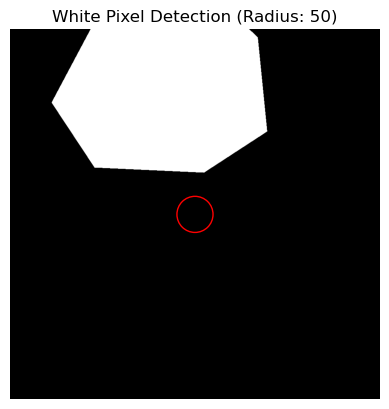

In [6]:
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt


image_path = '../data/2024-11-12-seg-dataset-1024/aug_train/masks/tile_75.png'
radius = 50
with Image.open(image_path) as img:
    img = img.convert("L")
    width, height = img.size
    center_x, center_y = width // 2, height // 2
    # Detect white pixels within the specified radius
    pixels = np.array(img)
    white_pixels = []
    for y in range(center_y - radius, center_y + radius + 1):
        for x in range(center_x - radius, center_x + radius + 1):
            if (0 <= x < width) and (0 <= y < height):
                if ((x - center_x) ** 2 + (y - center_y) ** 2) <= radius ** 2:
                    if pixels[y, x] == 255:  # White pixel
                        white_pixels.append((x, y))
    # Visualization
    fig, ax = plt.subplots()
    ax.imshow(img, cmap='gray')
    # Draw the radius check area (circle)
    circle = plt.Circle((center_x, center_y), radius, color='red', fill=False, linewidth=1)
    ax.add_patch(circle)
    # Mark found white pixels within the radius
    if white_pixels:
        white_x, white_y = zip(*white_pixels)
        ax.plot(white_x, white_y, 'bo', markersize=2)  # Blue dots for white pixels
    # Show the result
    plt.title(f"White Pixel Detection (Radius: {radius})")
    plt.axis("off")
    plt.show()


In [4]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm

def find_black_only_masks(src_folder):
    """
    Identifies mask images in the specified folder that contain only black pixels.

    Parameters:
    - src_folder (str): Path to the folder containing mask images.

    Returns:
    - black_only_masks (list): List of filenames of images that are completely black.
    """
    black_only_masks = []  # List to store filenames of black-only masks

    # Get all image files in the source folder
    image_files = [f for f in os.listdir(src_folder) if f.endswith(".png")]

    # Loop through each image file with a progress bar
    for filename in tqdm(image_files, desc="Checking for black-only masks"):
        img_path = os.path.join(src_folder, filename)
        with Image.open(img_path) as img:
            img = img.convert("L")  # Convert to grayscale

            # Convert image to a NumPy array for pixel analysis
            pixels = np.array(img)

            # Check if all pixels are black (value 0)
            if np.all(pixels == 0):
                black_only_masks.append(filename)

    print(f"Found {len(black_only_masks)} black-only mask(s) out of {len(image_files)} images.")
    return black_only_masks

# Example usage:
src_folder = '../data/2024-10-30-loc-dataset-1024/u_train/masks'  # Replace with the path to your folder containing mask images
black_only_masks = find_black_only_masks(src_folder)

# Print the results
if black_only_masks:
    print("Black-only masks found:")
    counter = 0
    for mask in black_only_masks:
        #print(mask)
        counter +=1
    print(counter)
    
else:
    print("No black-only masks found.")
    



Checking for black-only masks: 100%|██████████| 289/289 [00:00<00:00, 634.08it/s]

Found 86 black-only mask(s) out of 289 images.
Black-only masks found:
86


In [17]:
26596*100/32448

81.96499013806707

In [19]:
import os
import random
import shutil
import numpy as np
from PIL import Image
from tqdm import tqdm

def undersample_image_mask_pairs(src_image_folder, src_mask_folder, dest_image_folder, dest_mask_folder, sample_ratio=0.5):
    """
    Copies image-mask pairs to destination folders with undersampling on fully black masks.
    Only copies 50% of pairs where the mask is fully black, and all pairs where the mask has non-black pixels.

    Parameters:
    - src_image_folder (str): Source folder for original images.
    - src_mask_folder (str): Source folder for mask images.
    - dest_image_folder (str): Destination folder for undersampled images.
    - dest_mask_folder (str): Destination folder for undersampled masks.
    - sample_ratio (float): Ratio of full-black mask pairs to keep (default is 0.5).
    """
    # Ensure destination folders exist
    os.makedirs(dest_image_folder, exist_ok=True)
    os.makedirs(dest_mask_folder, exist_ok=True)

    # Get all mask files in the source folder
    mask_files = [f for f in os.listdir(src_mask_folder) if f.endswith(".png")]

    # Loop through each mask file with a progress bar
    for mask_filename in tqdm(mask_files, desc="Processing mask files", leave=False):
        mask_path = os.path.join(src_mask_folder, mask_filename)
        image_path = os.path.join(src_image_folder, mask_filename.replace('_shp_','_tif_'))  # Assuming image and mask have the same filename

        # Check if corresponding image exists
        if not os.path.exists(image_path):
            print(f"Warning: Corresponding image for mask {mask_filename} not found. Skipping.")
            continue

        with Image.open(mask_path) as mask:
            mask = mask.convert("L")  # Convert to grayscale for analysis
            pixels = np.array(mask)

            # Determine if mask is fully black
            is_black_only = np.all(pixels == 0)

            # Copy based on sampling criteria
            if not is_black_only or (is_black_only and random.random() < sample_ratio):
                # Copy both image and mask to destination folders
                shutil.copy(image_path, os.path.join(dest_image_folder, mask_filename.replace('_shp_','_tif_')))
                shutil.copy(mask_path, os.path.join(dest_mask_folder, mask_filename))

    print("Undersampling complete. Images and masks copied to destination folders.")

sizes = [192,256,384,512]

for size in tqdm(sizes, desc="Processing datasets"):
    dataset_folder = f'../../data/2024-10-30-loc-dataset-{size}'
    sample_name = 'aug_train'
    
    src_image_folder = os.path.join(dataset_folder,sample_name,'images')  # Folder containing source images
    src_mask_folder = os.path.join(dataset_folder,sample_name,'masks')  # Folder containing source masks
    dest_image_folder = os.path.join(dataset_folder,'aug_train_u','images')   # Destination folder for undersampled images
    dest_mask_folder = os.path.join(dataset_folder,'aug_train_u','masks')     # Destination folder for undersampled masks

    undersample_image_mask_pairs(src_image_folder, src_mask_folder, dest_image_folder, dest_mask_folder)


Processing datasets:   0%|          | 0/4 [04:31<?, ?it/s]


KeyboardInterrupt: 

In [8]:
import numpy as np
import torch
from torch import Tensor
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from scipy.ndimage import center_of_mass, label

def get_center_weight_map(mask, kernel_size=31, sigma=10):
    center_map = torch.zeros_like(mask, dtype=torch.float32)
    for batch_idx in range(mask.size(0)):
        mask_np = mask[batch_idx, 0].cpu().numpy()
        
        if np.any(mask_np == 1):
            #label connected components
            labeled_mask, num_features = label(mask_np)

            if num_features > 0:
                #find the center of each labeled spot
                centers = center_of_mass(mask_np, labels=labeled_mask, index=range(1, num_features + 1))

                for cy, cx in centers:
                    if not (torch.isnan(torch.tensor(cy)) or torch.isnan(torch.tensor(cx))):
                        cy, cx = int(cy), int(cx)
                        for y in range(max(0, cy - kernel_size // 2), min(mask.size(2), cy + kernel_size // 2)):
                            for x in range(max(0, cx - kernel_size // 2), min(mask.size(3), cx + kernel_size // 2)):
                                dist = torch.tensor(((y - cy) ** 2 + (x - cx) ** 2) / (2 * sigma ** 2), device=mask.device)
                                center_map[batch_idx, 0, y, x] += torch.exp(-dist)
    return center_map

def get_center_weight_map(mask, kernel_size=31, sigma=10):
    """
    Generates a Gaussian-weighted center map for each connected component in the binary mask.
    
    Parameters:
    - mask (torch.Tensor): Batch of binary masks with shape [batch, 1, height, width].
    - kernel_size (int): Size of the region around each center to apply the weight.
    - sigma (float): Standard deviation for the Gaussian weighting.

    Returns:
    - center_map (torch.Tensor): Weighted map with the same shape as `mask`.
    """
    center_map = torch.zeros_like(mask, dtype=torch.float32)
    
    for batch_idx in range(mask.size(0)):
        mask_np = mask[batch_idx, 0].cpu().numpy()
        
        # Skip fully black masks
        if np.all(mask_np == 0):
            continue  # Skip this mask if it's all black (no foreground)

        # Label connected components in the mask
        labeled_mask, num_features = label(mask_np)
        #print(np.unique(labeled_mask))
        #print(labeled_mask)
        #print(f'{labeled_mask}, -> {np.unique(labeled_mask)}, -> {np.unique(mask_np)}')
        if len(np.unique(labeled_mask)) > 1:
            try:
                # Calculate centers of mass for each labeled region
                centers = center_of_mass(mask_np, labels=labeled_mask, index=range(1, num_features + 1))

                for cy, cx in centers:
                    # Verify valid coordinates
                    if np.isnan(cy) or np.isnan(cx):
                        continue  # Skip if the center is invalid

                    cy, cx = int(cy), int(cx)
                    
                    # Define bounds for the Gaussian-weighted region around the center
                    y_min, y_max = max(0, cy - kernel_size // 2), min(mask.size(2), cy + kernel_size // 2)
                    x_min, x_max = max(0, cx - kernel_size // 2), min(mask.size(3), cx + kernel_size // 2)

                    # Apply Gaussian weight around each center
                    for y in range(y_min, y_max):
                        for x in range(x_min, x_max):
                            dist_sq = ((y - cy) ** 2 + (x - cx) ** 2) / (2 * sigma ** 2)
                            center_map[batch_idx, 0, y, x] += torch.exp(-torch.tensor(dist_sq, device=mask.device))
            
            except Exception as e:
                print(f"Error calculating center of mass for batch index {batch_idx}: {e}, {num_features}, {labeled_mask}, -> {np.unique(labeled_mask)}, -> {np.unique(mask_np)}")
                continue

    return center_map

def weighted_dice_score(pred, target, reduce_batch_first: bool = False,  epsilon=1e-6):
    assert pred.size() == target.size()
    assert pred.dim() == 3 or not reduce_batch_first

    sum_dim = (-1, -2) if pred.dim() == 2 or not reduce_batch_first else (-1, -2, -3)
    
    #print(target.size(),target.dim(), np.unique(target.cpu().numpy()))
    center_weight_map = get_center_weight_map(target.unsqueeze(0).unsqueeze(0), 56, 12) #torch.ones_like(target.unsqueeze(0).unsqueeze(0), dtype=torch.float32) 
    #normalize
    #center_weight_map /= center_weight_map.sum(dim=sum_dim, keepdim=True) + epsilon
    center_weight_map+=epsilon
    if torch.isnan(center_weight_map).any():
        raise ValueError("dice: center_weight_map returned None!")
    #activation
    #pred = torch.sigmoid(pred)
    #calc. weighted intersection and union
    inter = (pred * target * center_weight_map).sum(dim=sum_dim)
    union = (pred * center_weight_map).sum(dim=sum_dim) + (target * center_weight_map).sum(dim=sum_dim)
    if torch.isnan(inter).any():
        raise ValueError("dice: NaN values detected in intersection!")
    if torch.isnan(union).any():
        raise ValueError("dice: NaN values detected in union!")
    #calc. weighted Dice coef.
    #print((union + epsilon))
    dice = (2 * inter + epsilon) / (union + epsilon)
    if torch.isnan(dice).any():
        raise ValueError(f"dice contains NaN values: {dice}")
    #loss = 1 - dice.mean()
    #print(f'dice_mean: {dice.mean()}')
    
    return dice.mean() #loss

def dice_coeff(input: Tensor, target: Tensor, reduce_batch_first: bool = False, epsilon: float = 1e-6):
    # Average of Dice coefficient for all batches, or for a single mask
    assert input.size() == target.size()
    assert input.dim() == 3 or not reduce_batch_first

    sum_dim = (-1, -2) if input.dim() == 2 or not reduce_batch_first else (-1, -2, -3)

    inter = 2 * (input * target).sum(dim=sum_dim)
    union = input.sum(dim=sum_dim) + target.sum(dim=sum_dim)
    #sets_sum = torch.where(sets_sum == 0, inter, sets_sum)
    #print((union + epsilon))
    dice = (inter + epsilon) / (union + epsilon)
    return dice.mean()

# Assuming get_center_weight_map is defined above
import matplotlib.pyplot as plt
def visualize(center_map):

    center_map_np = center_map.cpu().numpy()
    
    # Plot the center map
    plt.figure(figsize=(2, 2))
    plt.imshow(center_map_np, cmap='hot')
    plt.colorbar(label='Weight')
    plt.title("Center Weight Map")
    plt.axis("off")
    plt.show()

In [7]:
import os
from PIL import Image
import torch
from torchvision import transforms

dir_path = '../data/2024-10-30-loc-dataset-512/aug_train_u10/masks'
images = [
    'tile_shp_47_14.png', #2
    'tile_shp_0_4.png', #0
    'tile_shp_47_11.png', #1
    'tile_shp_34_8.png' #6
]

for image in images:
    image = Image.open(os.path.join(dir_path, image)).convert("L")
    transform = transforms.ToTensor()
    mask = transform(image)
    #print(mask.squeeze().size())
    print(
        weighted_dice_score(
            torch.zeros_like(mask.squeeze(), dtype=torch.float32),
            mask.squeeze(),
            #mask.squeeze(),
        ),
        dice_coeff(
            torch.zeros_like(mask.squeeze(), dtype=torch.float32),
            mask.squeeze(),
            #mask.squeeze(),
        )
    )

    result = get_center_weight_map(mask.unsqueeze(0), 50, 10).squeeze()
    visualize(result)
    visualize(mask.squeeze())
    


    print(np.sum(result.cpu().numpy()>0), np.sum(mask.squeeze().cpu().numpy()>0))


    #np.unique(result)
    #
    #print(f'{result}')
    #np.unique(result)

NameError: name 'weighted_dice_score' is not defined

# obj. cl. metrics test

In [2]:
from scipy.ndimage import label, distance_transform_edt
from scipy.ndimage import gaussian_filter
import torch
import numpy as np
from scipy.ndimage import label
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np
import torch
from torch import Tensor
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from scipy.ndimage import center_of_mass, label
from PIL import Image
import os
from torchvision import transforms
import matplotlib.pyplot as plt



In [6]:
def gaussian_center_map(component_mask, sigma):
    # Create a distance map from the center of the object
    distance_map = distance_transform_edt(component_mask)
    # Apply Gaussian weighting based on distance from center
    center_map = 1-np.exp(-0.5 * (distance_map / sigma)**2)
    return center_map * component_mask

def calculate_objectwise_classification_metrics4(mask_pred, mask_true, threshold=0.5, weighted = False, sigma = 10):
    assert mask_pred.shape == mask_true.shape, f"Shape mismatch: {mask_pred.shape} and {mask_true.shape}"
    # Ensure we handle batches: mask_pred and mask_true are [B, H, W] tensors
    batch_size = mask_pred.shape[0]
    
    # Initialize cumulative metrics across the batch
    total_true_positive_count = 0
    total_false_positive_count = 0
    total_false_negative_count = 0
    iou_scores = []
    
    # Initialize cumulative masks
    tp_mask_batch = np.zeros_like(mask_true.cpu().numpy())
    fp_mask_batch = np.zeros_like(mask_true.cpu().numpy())
    fn_mask_batch = np.zeros_like(mask_true.cpu().numpy())
    
    for i in range(batch_size):
        # Extract each mask in the batch (single image)
        true_mask = mask_true[i].cpu().numpy()
        pred_mask = mask_pred[i].cpu().numpy()
        
        if np.all(true_mask == 0) and np.all(pred_mask == 0): #not returns 0 if both empty
            continue
        
        # Label connected components (objects) in both masks
        labeled_true = label(true_mask)
        labeled_pred = label(pred_mask)

        if isinstance(labeled_true, tuple):
            labeled_true = labeled_true[0]
        if isinstance(labeled_pred, tuple):
            labeled_pred = labeled_pred[0]
        if len(labeled_true.shape) != 2 or len(labeled_pred.shape) != 2:
            raise ValueError(f"Unexpected shape: labeled_true has shape {labeled_true.shape}, labeled_pred has shape {labeled_pred.shape}")
            
        labeled_true = np.asarray(labeled_true, dtype=np.int32)
        labeled_pred = np.asarray(labeled_pred, dtype=np.int32)


        # Initialize true positives, false positives, and false negatives
        tp_mask = np.zeros_like(true_mask)
        fp_mask = np.zeros_like(true_mask)
        fn_mask = np.zeros_like(true_mask)

        # Match predicted objects with true objects using Intersection over Union (IoU)
        true_objects = np.unique(labeled_true)[1:]  # Exclude background (label 0)
        pred_objects = np.unique(labeled_pred)[1:]

        true_positive_count = 0
        false_positive_count = 0
        false_negative_count = 0

        for pred_obj in pred_objects:
            pred_obj_mask = labeled_pred == pred_obj
            if weighted:
                weighted_pred_obj = gaussian_center_map(pred_obj_mask, sigma)
                print(np.unique(weighted_pred_obj))
                fig, ax = plt.subplots(1, 1, figsize=(12, 2))
                ax.imshow(weighted_pred_obj)
                ax.set_title("Image")
                ax.axis('on')
                plt.show()
                
            
            obj_iou_scores = []
            for true_obj in true_objects:
                true_obj_mask = labeled_true == true_obj
                if weighted:
                    weighted_true_obj = gaussian_center_map(true_obj_mask, sigma)
                    intersection = np.sum(weighted_pred_obj * weighted_true_obj)
                    union = np.sum(np.maximum(weighted_pred_obj, weighted_true_obj))
                else:
                    intersection = np.logical_and(pred_obj_mask, true_obj_mask).sum()
                    union = np.logical_or(pred_obj_mask, true_obj_mask).sum()
                iou = intersection / union if union > 0 else 0
                obj_iou_scores.append(iou)

            max_iou = max(obj_iou_scores) if obj_iou_scores else 0
            iou_scores.append(max_iou)
            if max_iou >= threshold:
                true_positive_count += 1
                tp_mask[pred_obj_mask] = 1
            else:
                false_positive_count += 1
                fp_mask[pred_obj_mask] = 1

        for true_obj in true_objects:
            true_obj_mask = labeled_true == true_obj
            if not np.logical_and(true_obj_mask, pred_mask).any():
                false_negative_count += 1
                fn_mask[true_obj_mask] = 1

        # Accumulate results for each image in the batch
        total_true_positive_count += true_positive_count
        total_false_positive_count += false_positive_count
        total_false_negative_count += false_negative_count

        # Accumulate the masks
        tp_mask_batch[i] = tp_mask
        fp_mask_batch[i] = fp_mask
        fn_mask_batch[i] = fn_mask

    # Calculate metrics across the whole batch
    total = total_true_positive_count + total_false_positive_count + total_false_negative_count
    accuracy = total_true_positive_count / total if total > 0 else 0
    precision = total_true_positive_count / (total_true_positive_count + total_false_positive_count) if (total_true_positive_count + total_false_positive_count) > 0 else 0
    recall = total_true_positive_count / (total_true_positive_count + total_false_negative_count) if (total_true_positive_count + total_false_negative_count) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    mean_iou = np.mean(iou_scores) if iou_scores else 1.0
    
    print(iou_scores)
    return accuracy, precision, recall, f1, mean_iou, tp_mask_batch, fp_mask_batch, fn_mask_batch

In [129]:
import numpy as np
import torch
from scipy.ndimage import label, center_of_mass
from scipy.ndimage import distance_transform_edt

def get_center_weight_map(mask, kernel_size=31, sigma=10):
    """
    Generates a Gaussian-weighted center map for each connected component in the binary mask.
    
    Parameters:
    - mask (np.array): Binary mask [H, W].
    - kernel_size (int): Size of the Gaussian kernel.
    - sigma (float): Standard deviation for the Gaussian weighting.

    Returns:
    - center_map (np.array): Weighted map with the same shape as `mask`.
    """
    center_map = np.zeros_like(mask, dtype=np.float32)
    mask_np = mask.astype(np.uint8)
    
    # Label connected components in the mask
    labeled_mask, num_features = label(mask_np)

    # Calculate centers of mass for each labeled region
    centers = center_of_mass(mask_np, labels=labeled_mask, index=range(1, num_features + 1))

    for cy, cx in centers:
        cy, cx = int(cy), int(cx)
        
        # Define bounds for the Gaussian-weighted region around the center
        y_min, y_max = max(0, cy - kernel_size // 2), min(mask.shape[0], cy + kernel_size // 2)
        x_min, x_max = max(0, cx - kernel_size // 2), min(mask.shape[1], cx + kernel_size // 2)

        # Apply Gaussian weight around each center
        for y in range(y_min, y_max):
            for x in range(x_min, x_max):
                dist_sq = ((y - cy) ** 2 + (x - cx) ** 2) / (2 * sigma ** 2)
                center_map[y, x] += np.exp(-dist_sq)

    return center_map

def calculate_objectwise_classification_metrics4(mask_pred, mask_true, threshold=0.5, sigma=10, kernel_size=50, weighted = True):
    """
    Calculates IoU for each object in the batch, applying center weighting from `get_center_weight_map`.
    
    Parameters:
    - mask_pred (torch.Tensor): Predicted mask [B, H, W].
    - mask_true (torch.Tensor): Ground truth mask [B, H, W].
    - threshold (float): Threshold for IoU to count as true positive.
    - sigma (float): Standard deviation for Gaussian center weight.
    - kernel_size (int): Size of the Gaussian kernel.

    Returns:
    - metrics dictionary with accuracy, precision, recall, F1, mean IoU.
    """
    batch_size = mask_pred.shape[0]
    total_true_positive_count = 0
    total_false_positive_count = 0
    total_false_negative_count = 0
    iou_scores = []
    
    tp_mask_batch = np.zeros_like(mask_true.cpu().numpy())
    fp_mask_batch = np.zeros_like(mask_true.cpu().numpy())
    fn_mask_batch = np.zeros_like(mask_true.cpu().numpy())
    
    for i in range(batch_size):
        # Extract each mask in the batch (single image)
        true_mask = mask_true[i].cpu().numpy()
        pred_mask = mask_pred[i].cpu().numpy()

        if np.all(true_mask == 0) and np.all(pred_mask == 0):  # skip empty masks
            continue

        # Label connected components (objects) in both masks
        labeled_true, num_true_objects = label(true_mask)
        labeled_pred, num_pred_objects = label(pred_mask)
        
        tp_mask = np.zeros_like(true_mask)
        fp_mask = np.zeros_like(true_mask)
        fn_mask = np.zeros_like(true_mask)

        # Initialize true positives, false positives, and false negatives
        true_positive_count = 0
        false_positive_count = 0
        false_negative_count = 0

        for pred_obj in range(1, num_pred_objects + 1):
            pred_obj_mask = labeled_pred == pred_obj
            #weighted_pred_obj = get_center_weight_map(pred_obj_mask, kernel_size, sigma)

            obj_iou_scores = []
            for true_obj in range(1, num_true_objects + 1):
                true_obj_mask = labeled_true == true_obj
                weighted_true_obj = get_center_weight_map(true_obj_mask, kernel_size, sigma)

                # Calculate weighted intersection and union
                intersection = np.sum(true_obj_mask * pred_obj_mask * weighted_true_obj)
                union = np.sum(pred_obj_mask*weighted_true_obj) + np.sum(true_obj_mask*weighted_true_obj) - intersection
                iou = intersection / union if union > 0 else 0
                obj_iou_scores.append(iou)

            max_iou = max(obj_iou_scores) if obj_iou_scores else 0
            iou_scores.append(max_iou)
            if max_iou >= threshold:
                true_positive_count += 1
                tp_mask[pred_obj_mask] = 1
            else:
                false_positive_count += 1
                fp_mask[pred_obj_mask] = 1

        # Count false negatives (objects in true_mask without corresponding predictions)
        for true_obj in range(1, num_true_objects + 1):
            true_obj_mask = labeled_true == true_obj
            if not np.any(pred_mask[true_obj_mask]):
                false_negative_count += 1

        # Accumulate results for each image in the batch
        total_true_positive_count += true_positive_count
        total_false_positive_count += false_positive_count
        total_false_negative_count += false_negative_count
        
        tp_mask_batch[i] = tp_mask
        fp_mask_batch[i] = fp_mask
        fn_mask_batch[i] = fn_mask

    # Calculate metrics across the whole batch
    total = total_true_positive_count + total_false_positive_count + total_false_negative_count
    accuracy = total_true_positive_count / total if total > 0 else 0
    precision = total_true_positive_count / (total_true_positive_count + total_false_positive_count) if (total_true_positive_count + total_false_positive_count) > 0 else 0
    recall = total_true_positive_count / (total_true_positive_count + total_false_negative_count) if (total_true_positive_count + total_false_negative_count) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    mean_iou = np.mean(iou_scores) if iou_scores else 1.0
    print(iou_scores)
    return accuracy, precision, recall, f1, mean_iou, tp_mask_batch, fp_mask_batch, fn_mask_batch


In [23]:
def calculate_objectwise_classification_metrics4(mask_pred, mask_true, threshold=0.5, weighted = False, sigma=10, kernel_size=50):
    assert mask_pred.shape == mask_true.shape, f"Shape mismatch: {mask_pred.shape} and {mask_true.shape}"
    # Ensure we handle batches: mask_pred and mask_true are [B, H, W] tensors
    batch_size = mask_pred.shape[0]
    
    # Initialize cumulative metrics across the batch
    total_true_positive_count = 0
    total_false_positive_count = 0
    total_false_negative_count = 0
    iou_scores = []
    
    # Initialize cumulative masks
    tp_mask_batch = np.zeros_like(mask_true.cpu().numpy())
    fp_mask_batch = np.zeros_like(mask_true.cpu().numpy())
    fn_mask_batch = np.zeros_like(mask_true.cpu().numpy())
    
    for i in range(batch_size):
        # Extract each mask in the batch (single image)
        true_mask = mask_true[i].cpu().numpy()
        pred_mask = mask_pred[i].cpu().numpy()
        
        if np.all(true_mask == 0) and np.all(pred_mask == 0): #not returns 0 if both empty
            continue
        
        # Label connected components (objects) in both masks
        labeled_true = label(true_mask)
        labeled_pred = label(pred_mask)

        if isinstance(labeled_true, tuple):
            labeled_true = labeled_true[0]
        if isinstance(labeled_pred, tuple):
            labeled_pred = labeled_pred[0]
        if len(labeled_true.shape) != 2 or len(labeled_pred.shape) != 2:
            raise ValueError(f"Unexpected shape: labeled_true has shape {labeled_true.shape}, labeled_pred has shape {labeled_pred.shape}")
            
        labeled_true = np.asarray(labeled_true, dtype=np.int32)
        labeled_pred = np.asarray(labeled_pred, dtype=np.int32)


        # Initialize true positives, false positives, and false negatives
        tp_mask = np.zeros_like(true_mask)
        fp_mask = np.zeros_like(true_mask)
        fn_mask = np.zeros_like(true_mask)

        # Match predicted objects with true objects using Intersection over Union (IoU)
        true_objects = np.unique(labeled_true)[1:]  # Exclude background (label 0)
        pred_objects = np.unique(labeled_pred)[1:]

        true_positive_count = 0
        false_positive_count = 0
        false_negative_count = 0

        for pred_obj in pred_objects:
            pred_obj_mask = labeled_pred == pred_obj
            
            obj_iou_scores = []
            for true_obj in true_objects:
                true_obj_mask = labeled_true == true_obj
                if weighted:
                    weighted_true_obj = gaussian_center_map(true_obj_mask, sigma) #gaussian_center_map(true_obj_mask, sigma)
                    intersection = np.sum(true_obj_mask * pred_obj_mask * weighted_true_obj)
                    union = np.sum(pred_obj_mask*weighted_true_obj) + np.sum(true_obj_mask*weighted_true_obj) - intersection
                else:
                    intersection = np.logical_and(pred_obj_mask, true_obj_mask).sum()
                    union = np.logical_or(pred_obj_mask, true_obj_mask).sum()
                iou = intersection / union if union > 0 else 0
                obj_iou_scores.append(iou)

            max_iou = max(obj_iou_scores) if obj_iou_scores else 0
            iou_scores.append(max_iou)
            if max_iou >= threshold:
                true_positive_count += 1
                tp_mask[pred_obj_mask] = 1
            else:
                false_positive_count += 1
                fp_mask[pred_obj_mask] = 1

        for true_obj in true_objects:
            true_obj_mask = labeled_true == true_obj
            if not np.logical_and(true_obj_mask, pred_mask).any():
                false_negative_count += 1
                fn_mask[true_obj_mask] = 1

        # Accumulate results for each image in the batch
        total_true_positive_count += true_positive_count
        total_false_positive_count += false_positive_count
        total_false_negative_count += false_negative_count

        # Accumulate the masks
        tp_mask_batch[i] = tp_mask
        fp_mask_batch[i] = fp_mask
        fn_mask_batch[i] = fn_mask

    # Calculate metrics across the whole batch
    total = total_true_positive_count + total_false_positive_count + total_false_negative_count
    if total == 0:
        accuracy = 1.0
        precision = 1.0
        recall = 1.0
        f1 = 1.0
        mean_iou = 1.0
    else:
        accuracy = total_true_positive_count / total if total > 0 else 1.0
        precision = total_true_positive_count / (total_true_positive_count + total_false_positive_count) if (total_true_positive_count + total_false_positive_count) > 0 else 0.0
        recall = total_true_positive_count / (total_true_positive_count + total_false_negative_count) if (total_true_positive_count + total_false_negative_count) > 0 else 0.0
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0
        mean_iou = np.mean(iou_scores) if iou_scores else 0.0
    return accuracy, precision, recall, f1, mean_iou, tp_mask_batch, fp_mask_batch, fn_mask_batch




{'w_accuracy': 0.0, 'w_precision': 0.0, 'w_recall': 0.0, 'w_f1': 0.0, 'w_mean_iou': 0.0}


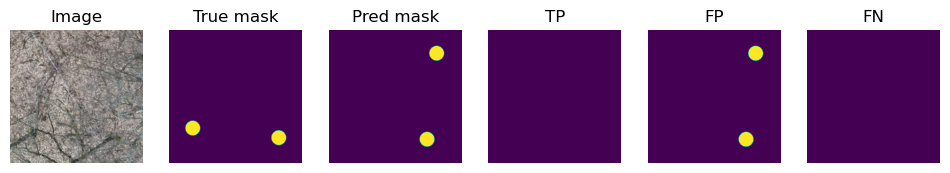

In [41]:
dir_path = '../data/2024-10-30-loc-dataset-512/aug_train_u10/masks'

images = [
    'tile_shp_46_11.png'
    
    #'tile_shp_47_14.png', #2
    #'tile_shp_0_4.png', #0
    #'tile_shp_47_11.png', #1
    #'tile_shp_34_8.png' #6
]

for image_name in images[:1]:
    image = Image.open(os.path.join(dir_path, image_name)).convert("L")
    transform = transforms.ToTensor()
    mask = transform(image)
    
    pred = Image.open(os.path.join(dir_path, image_name.replace('.','_90.'))).convert("L")#.transpose(Image.FLIP_TOP_BOTTOM)
    transform = transforms.ToTensor()
    pred_mask = transform(pred)
    
    
    
    #print(torch.zeros_like(mask, dtype=torch.float32).squeeze(1).long().shape, mask.squeeze(1).shape)
    #w_accuracy, w_precision, w_recall, w_f1, w_mean_iou, tp_mask_batch, fp_mask_batch, fn_mask_batch = calculate_objectwise_classification_metrics4(
    #    pred_mask.squeeze(1),#torch.zeros_like(mask, dtype=torch.float32).squeeze(1).long(),#.numpy(),#mask_pred,#.squeeze(1), 
    #    mask.squeeze(1),
    #    threshold = 0.5,
    #    weighted = True,
    #    sigma = 1
    #)
    #torch.zeros_like(mask, dtype=torch.float32).squeeze(1),#
    #torch.zeros_like(mask, dtype=torch.float32).squeeze(1),#
    w_accuracy, w_precision, w_recall, w_f1, w_mean_iou, tp_mask_batch, fp_mask_batch, fn_mask_batch = calculate_objectwise_classification_metrics4(
        pred_mask.squeeze(1),#torch.zeros_like(mask, dtype=torch.float32).squeeze(1).long(),#.numpy(),#mask_pred,#.squeeze(1), 
        torch.zeros_like(mask, dtype=torch.float32).squeeze(1),#mask.squeeze(1),
        threshold = 0.00025,
        weighted = True,
    )
    fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(12, 2))

    ax1.imshow(Image.open(os.path.join(dir_path.replace('masks','images'), image_name.replace('shp','tif'))), cmap='viridis')
    ax1.set_title("Image")
    ax1.axis('off')

    ax2.imshow(image, cmap='viridis')
    ax2.set_title("True mask")
    ax2.axis('off')

    ax3.imshow(pred_mask.squeeze(0), cmap='viridis')
    ax3.set_title("Pred mask")
    ax3.axis('off')

    ax4.imshow(tp_mask_batch[0], cmap='viridis')
    ax4.set_title("TP")
    ax4.axis('off')

    ax5.imshow(fp_mask_batch[0], cmap='viridis')
    ax5.set_title("FP")
    ax5.axis('off')

    ax6.imshow(fn_mask_batch[0], cmap='viridis')
    ax6.set_title("FN")
    ax6.axis('off')

    print({
        'w_accuracy' :  w_accuracy,
        'w_precision' :  w_precision,
        'w_recall' :  w_recall,
        'w_f1' :  w_f1,
        'w_mean_iou' :  w_mean_iou,
    })
    plt.show()
    


In [2]:
from PIL import Image

# Load the image
image_path = '../data/2024-10-30-loc-dataset-1024/u_test/images/tile_tif_9_0.png'
image = Image.open(image_path)

# Get size
width, height = image.size
print(f"Width: {width}, Height: {height}")


Width: 512, Height: 512


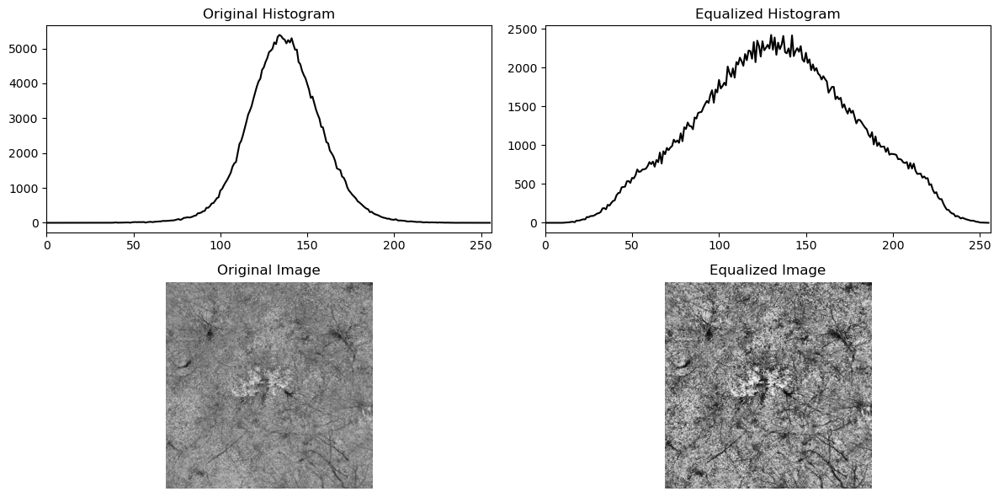

In [4]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load a grayscale image
image_path = '../../data/2024-11-13-seg-dataset-1024/u_aug_train/images/tile_135.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Check if the image was loaded correctly
if image is None:
    raise FileNotFoundError(f"Image not found at path: {image_path}")

# Apply Histogram Equalization
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
equalized_image = clahe.apply(image)
#equalized_image = cv2.equalizeHist(image)

# Plot histogram for visualization
original_hist = cv2.calcHist([image], [0], None, [256], [0, 256])
equalized_hist = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])

plt.figure(figsize=(12, 6))

# Plot the original histogram
plt.subplot(2, 2, 1)
plt.title('Original Histogram')
plt.plot(original_hist, color='black')
plt.xlim([0, 256])

# Plot the equalized histogram
plt.subplot(2, 2, 2)
plt.title('Equalized Histogram')
plt.plot(equalized_hist, color='black')
plt.xlim([0, 256])

# Display the original image
plt.subplot(2, 2, 3)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

# Display the equalized image
plt.subplot(2, 2, 4)
plt.title('Equalized Image')
plt.imshow(equalized_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


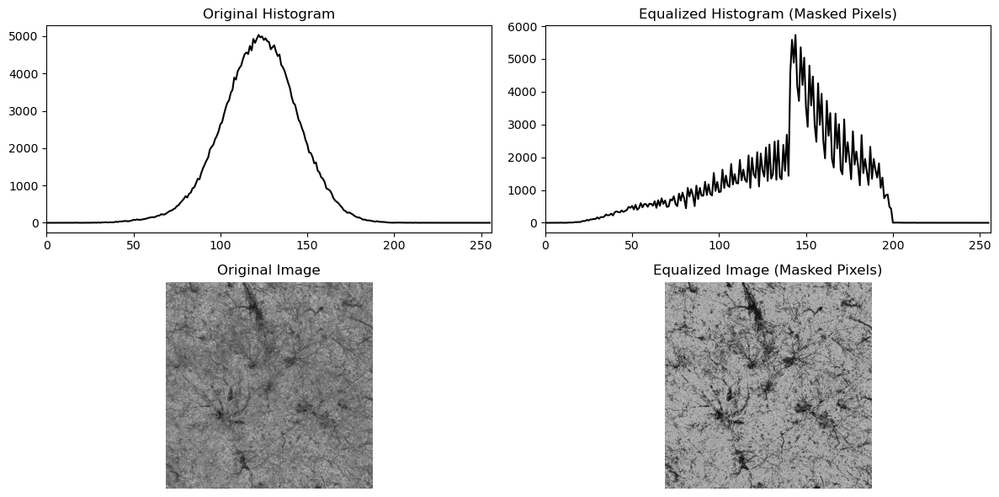

In [25]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load a grayscale image
image_path = '../../data/2024-11-13-seg-dataset-1024/u_aug_train/images/tile_350.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Check if the image was loaded correctly
if image is None:
    raise FileNotFoundError(f"Image not found at path: {image_path}")

# Create a mask for pixels with value > 200
mask = (image >= 0) & (image <= 140)#image < 125


# Apply histogram equalization only to the masked region
equalized_image = image.copy()  # Copy the original image

# Mask the image and equalize the masked pixels
masked_pixels = image[mask]  # Extract masked pixels (1D array)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
equalized_part = clahe.apply(masked_pixels)
#equalized_part = cv2.equalizeHist(masked_pixels)  # Equalize only the masked pixels

# Reshape the equalized part back into the shape of the mask
equalized_image[mask] = equalized_part.reshape(-1)  # Assign the equalized pixels back

# Plot histogram for visualization
original_hist = cv2.calcHist([image], [0], None, [256], [0, 256])
equalized_hist = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])

plt.figure(figsize=(12, 6))

# Plot the original histogram
plt.subplot(2, 2, 1)
plt.title('Original Histogram')
plt.plot(original_hist, color='black')
plt.xlim([0, 256])

# Plot the equalized histogram
plt.subplot(2, 2, 2)
plt.title('Equalized Histogram (Masked Pixels)')
plt.plot(equalized_hist, color='black')
plt.xlim([0, 256])

# Display the original image
plt.subplot(2, 2, 3)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

# Display the equalized image
plt.subplot(2, 2, 4)
plt.title('Equalized Image (Masked Pixels)')
plt.imshow(equalized_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


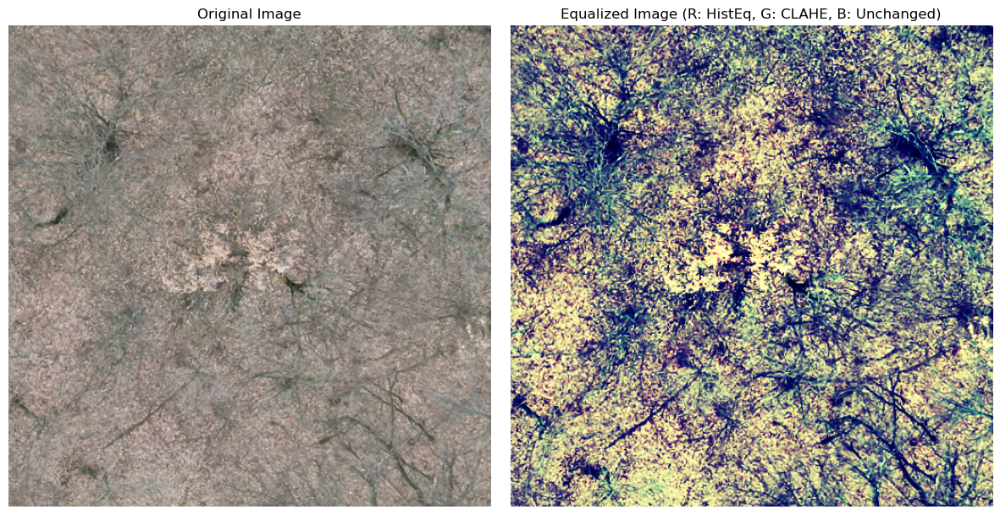

In [32]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load a color image
image_path = '../../data/2024-11-13-seg-dataset-1024/u_aug_train/images/tile_135.png'
image = cv2.imread(image_path)

# Check if the image was loaded correctly
if image is None:
    raise FileNotFoundError(f"Image not found at path: {image_path}")

# Convert the image to RGB (OpenCV loads images in BGR format by default)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Split the image into its R, G, and B channels
r_channel, g_channel, b_channel = cv2.split(image_rgb)

# Apply histogram equalization to each channel with different methods
# Example: Equalize only R and G channels, leave B channel unchanged
equalized_r = cv2.equalizeHist(r_channel)#r_channel #cv2.equalizeHist(r_channel)  # Equalize R channel
equalized_g = cv2.equalizeHist(g_channel) #cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8, 8)).apply(g_channel)  # CLAHE on G channel
equalized_b = b_channel #cv2.equalizeHist(b_channel)# cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8, 8)).apply(g_channel) #b_channel  # Leave B channel unchanged

# Merge the channels back
equalized_image = cv2.merge([equalized_r, equalized_g, equalized_b])

# Plot the original and equalized images
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image_rgb)
plt.axis('off')

# Equalized image
plt.subplot(1, 2, 2)
plt.title('Equalized Image (R: HistEq, G: CLAHE, B: Unchanged)')
plt.imshow(equalized_image)
plt.axis('off')

plt.tight_layout()
plt.show()


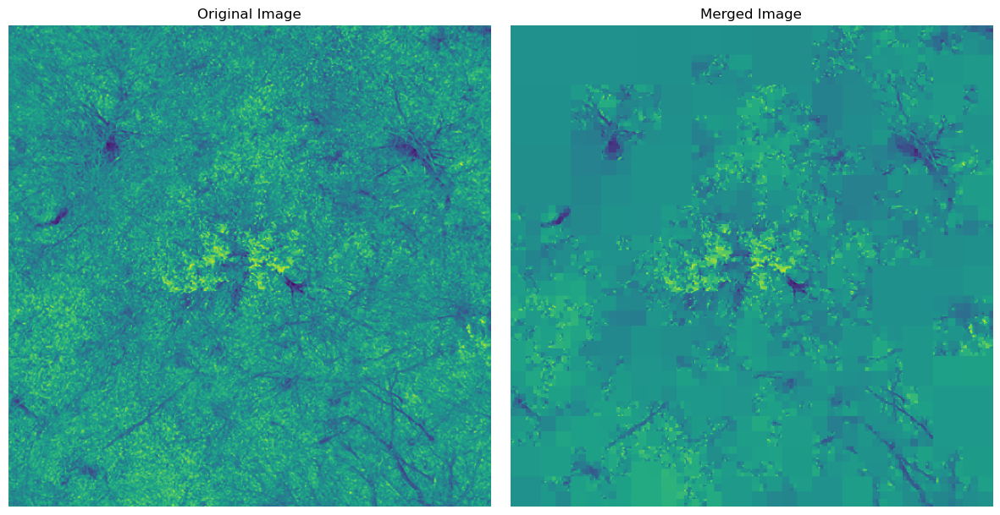

In [84]:
import cv2
import numpy as np
from scipy.ndimage import label

def is_homogeneous(region, threshold=20):
    """
    Homogenitási kritérium: a régió intenzitásának szórása kisebb egy küszöbértéknél.
    """
    return np.std(region) < threshold

def split_merge(image, threshold=20):
    """
    Felosztás és egyesítés algoritmusa.
    """
    h, w = image.shape
    if h != w or (h & (h - 1)) != 0:  # Ellenőrzés: 2 hatványa-e
        raise ValueError("A kép szélessége és magassága legyen 2 hatványa!")

    def split(image, x, y, size):
        """
        Rekurzív felosztás.
        """
        region = image[y:y + size, x:x + size]
        if size == 1 or is_homogeneous(region, threshold):
            return [(x, y, size)]  # Homogén régió
        size //= 2
        return (split(image, x, y, size) +
                split(image, x + size, y, size) +
                split(image, x, y + size, size) +
                split(image, x + size, y + size, size))

    def merge(regions, image):
        """
        Egyesítés homogén kritérium alapján.
        """
        merged = np.zeros_like(image)
        for x, y, size in regions:
            merged[y:y + size, x:x + size] = np.mean(image[y:y + size, x:x + size])
        return merged

    # Felosztás
    regions = split(image, 0, 0, h)

    # Egyesítés
    merged_image = merge(regions, image)

    return merged_image, regions

# Tesztelés
image_path = '../../data/2024-11-13-seg-dataset-1024/u_aug_train/images/tile_135.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
merged_image, regions = split_merge(image, threshold=17)


plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

# Equalized image
plt.subplot(1, 2, 2)
plt.title('Merged Image')
plt.imshow(merged_image)
plt.axis('off')

plt.tight_layout()
plt.show()


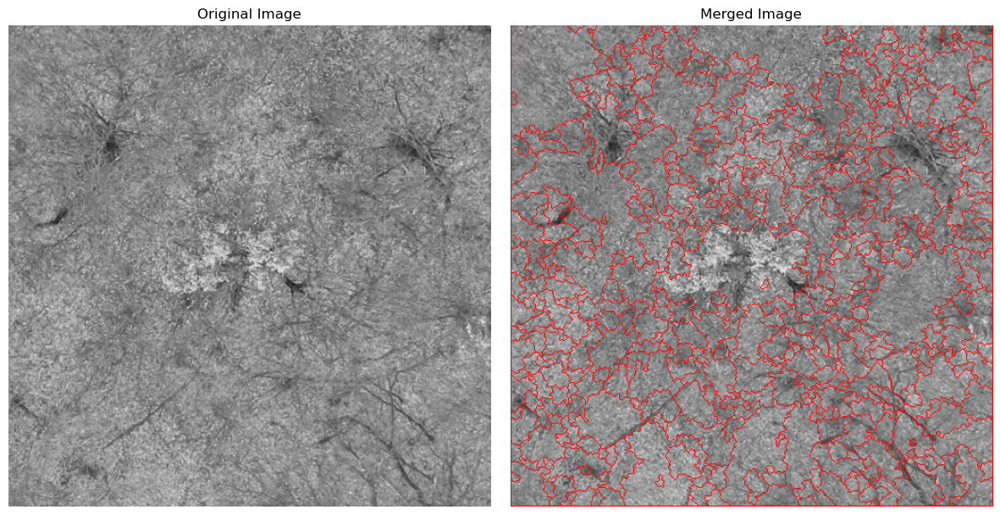

In [75]:
import cv2
import numpy as np

def watershed_segmentation(image):
    """
    Watershed algoritmus.
    """
    # Előfeldolgozás: szűrés
    blurred = cv2.medianBlur(image, 25)

    # Gradiens számítása (Sobel maszk)
    gradient_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = cv2.magnitude(gradient_x, gradient_y).astype(np.uint8)

    # Lokális minimumok keresése
    ret, binary = cv2.threshold(gradient_magnitude, 250, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    kernel = np.ones((3, 3), np.uint8)
    sure_bg = cv2.dilate(binary, kernel, iterations=3)
    sure_fg = cv2.erode(binary, kernel, iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Marker létrehozása
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1  # A háttér legyen 1
    markers[unknown == 255] = 0

    # Watershed alkalmazása
    image_colored = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(image_colored, markers)
    image_colored[markers == -1] = [255, 0, 0]  # Határvonalak pirossal

    return image_colored

# Tesztelés
image_path = '../../data/2024-11-13-seg-dataset-1024/u_aug_train/images/tile_135.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
watershed_image = watershed_segmentation(image)

plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Equalized image
plt.subplot(1, 2, 2)
plt.title('Merged Image')
plt.imshow(watershed_image)
plt.axis('off')

plt.tight_layout()
plt.show()


In [49]:
def desaturation(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower_green = np.array([35, 40, 40])  #adjust needed
    upper_green = np.array([85, 255, 255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)

    #desaturate areas outside of the green mask
    hsv[:, :, 1] = cv2.bitwise_and(hsv[:, :, 1], green_mask)

    return cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

def shadow_boosting(image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    if len(image.shape) == 3:
        return cv2.merge([clahe.apply(channel) for channel in cv2.split(image)])
    else:
        return clahe.apply(image) #grayscale  

def NDVI(image):
    green = image[:, :, 1].astype(float)
    red = image[:, :, 2].astype(float)

    # Calculate NDVI
    ndvi = (green - red) / (green + red + 1e-5)  # Adding small value to avoid division by zero

    return cv2.normalize(ndvi, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

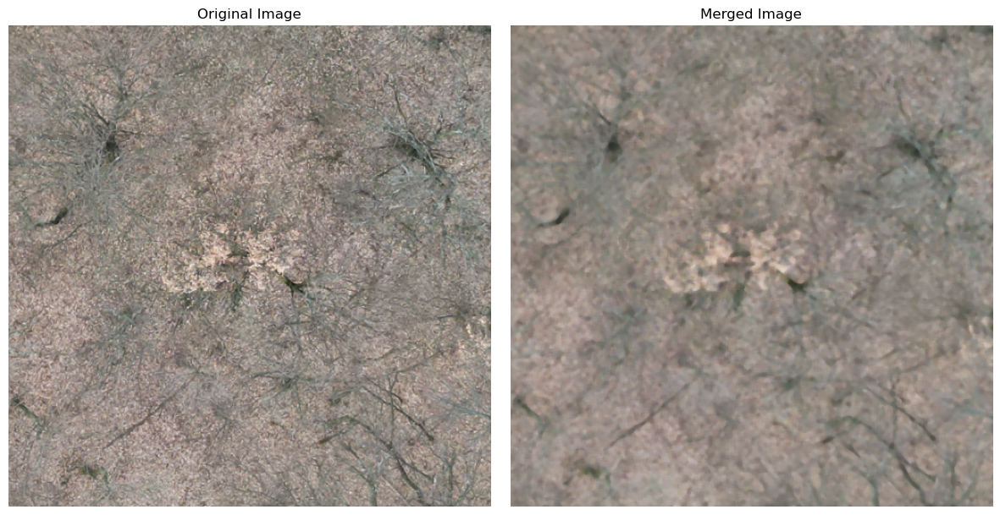

In [102]:
image_path = '../../data/2024-11-13-seg-dataset-1024/u_aug_train/images/tile_135.png'
image = in_image = cv2.imread(image_path)
#in_image = image = cv2.cvtColor(NDVI(image), cv2.COLOR_GRAY2BGR)
#image = watershed_segmentation(image)
image = cv2.medianBlur(image, 5)

#image, regions = split_merge(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), threshold=17)

plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(in_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Equalized image
plt.subplot(1, 2, 2)
plt.title('Merged Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()


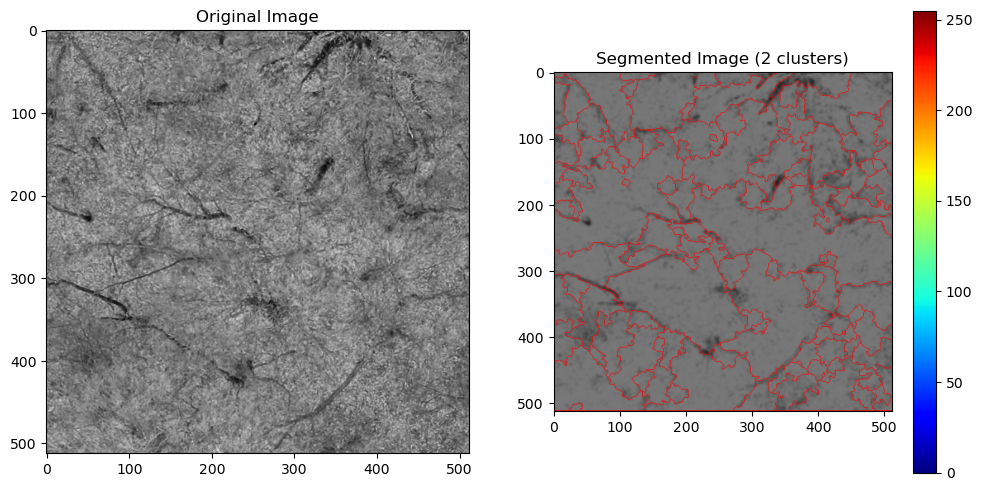

In [206]:
import numpy as np
import cv2
from skfuzzy import cmeans
import matplotlib.pyplot as plt

def watershed_segmentation(image):
    """
    Watershed algoritmus.
    """
    # Előfeldolgozás: szűrés
    blurred = cv2.medianBlur(image, 3)

    # Gradiens számítása (Sobel maszk)
    gradient_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = cv2.magnitude(gradient_x, gradient_y).astype(np.uint8)

    # Lokális minimumok keresése
    ret, binary = cv2.threshold(gradient_magnitude, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    kernel = np.ones((5, 5), np.uint8)
    sure_bg = cv2.dilate(binary, kernel, iterations=3)
    sure_fg = cv2.erode(binary, kernel, iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Marker létrehozása
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1  # A háttér legyen 1
    markers[unknown == 255] = 0

    # Watershed alkalmazása
    image_colored = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(image_colored, markers)
    image_colored[markers == -1] = [255, 0, 0]  # Határvonalak pirossal

    return image_colored

def fuzzy_cmeans_segmentation(image, n_clusters=3, fuzziness=5.0, max_iter=300, error=0.005):
    """
    Perform Fuzzy C-Means clustering for image segmentation.

    Parameters:
        image (np.ndarray): Grayscale input image (2D array).
        n_clusters (int): Number of clusters (regions).
        fuzziness (float): Fuzzification parameter (m > 1).
        max_iter (int): Maximum number of iterations.
        error (float): Tolerance for stopping criterion.

    Returns:
        segmented_image (np.ndarray): Segmented image where each pixel is assigned to the most likely cluster.
        membership (np.ndarray): Membership values for each pixel in all clusters.
    """
    # Flatten the image and normalize it
    flat_image = image.flatten() / 255.0
    
    # Reshape for fuzzy c-means
    data = np.expand_dims(flat_image, axis=0)
    
    # Fuzzy C-Means clustering
    cntr, u, _, _, _, _, _ = cmeans(
        data=data,
        c=n_clusters,
        m=fuzziness,
        error=error,
        maxiter=max_iter,
        init=None
    )
    
    # Determine the most likely cluster for each pixel
    cluster_labels = np.argmax(u, axis=0)
    segmented_image = cluster_labels.reshape(image.shape)
    
    return segmented_image, u

# Load a grayscale image
image_path = '../../data/2024-11-13-seg-dataset-1024/u_aug_train/images/tile_150.png'
image = in_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
_, image = cv2.threshold(image, 120, 50, cv2.THRESH_TRUNC)
#image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image = cv2.GaussianBlur(image, (7, 7), 0)

#image, regions = split_merge(image, threshold=5)
#_, image = cv2.threshold(image, 110, 0, cv2.THRESH_BINARY)

# Perform fuzzy C-means clustering
image = watershed_segmentation(image)
#segmented_image, membership = fuzzy_cmeans_segmentation(
#    image,
#    n_clusters=2,
#    fuzziness=10.0,
#    max_iter=100,
#    error=0.005
#)

# Plot the original image and the segmented result
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(in_image, cmap='gray')

plt.subplot(1, 2, 2)
plt.title(f'Segmented Image (2 clusters)')
plt.imshow(image, cmap='jet')  # Color-coded regions
plt.colorbar()
plt.show()


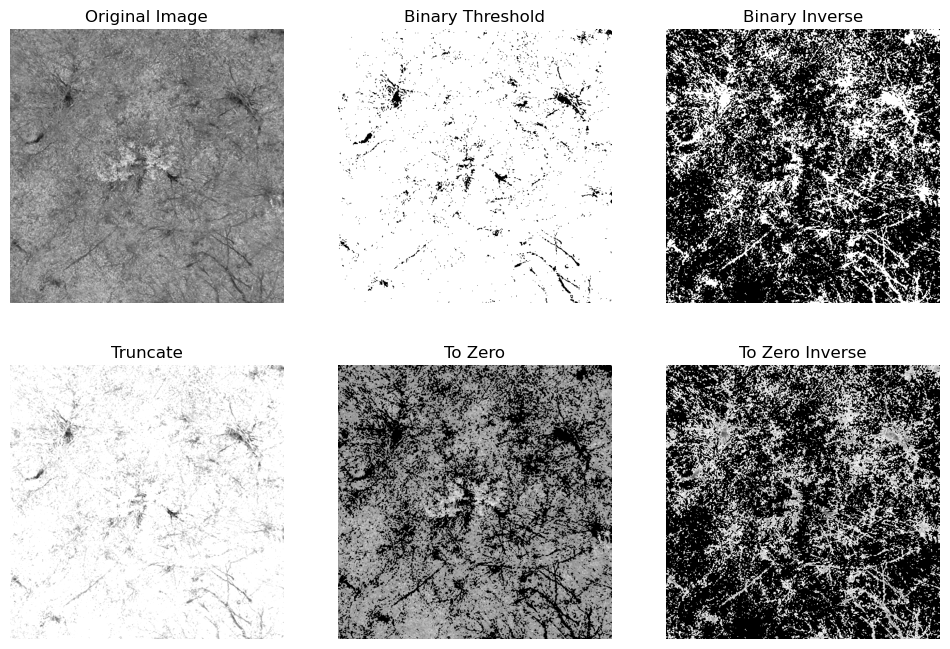

In [147]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load a grayscale image
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply simple thresholding
_, binary_thresh = cv2.threshold(image, 100, 255, cv2.THRESH_BINARY)
_, binary_inv_thresh = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY_INV)
_, trunc_thresh = cv2.threshold(image, 127, 255, cv2.THRESH_TRUNC)
_, tozero_thresh = cv2.threshold(image, 127, 255, cv2.THRESH_TOZERO)
_, tozero_inv_thresh = cv2.threshold(image, 127, 255, cv2.THRESH_TOZERO_INV)

# Plot the results
titles = ['Original Image', 'Binary Threshold', 'Binary Inverse', 
          'Truncate', 'To Zero', 'To Zero Inverse']
images = [image, binary_thresh, binary_inv_thresh, trunc_thresh, tozero_thresh, tozero_inv_thresh]

plt.figure(figsize=(12, 8))
for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
plt.show()


torch.Size([1, 1, 256, 256])
torch.Size([1, 1, 256, 256])


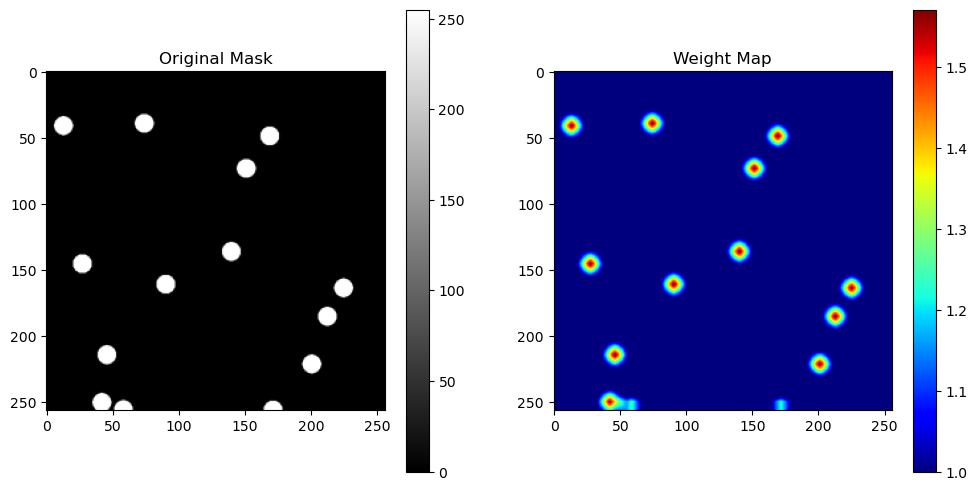

In [262]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import torch

# Load the mask from a PNG file
image_path = "../../data/2024-10-30-loc-dataset-1024/u_aug_train_u10/masks/tile_shp_14_10.png"  # Replace with the actual file path
mask_image = Image.open(image_path).convert("L")  # Convert to grayscale

# Resize the image to 256x256 if it's not already
mask_image = mask_image.resize((256, 256))
mask_array = np.array(mask_image, dtype=np.float32)  
# Convert the image to a PyTorch tensor and normalize the values to [0, 1]
mask = torch.tensor(mask_array, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

print(mask.size())
# Generate a sample mask: a 2D binary mask with a circular region
#mask = torch.zeros((1, 1, 256, 256), dtype=torch.float32)
#cy, cx = 128, 128  # Center of the circle
#radius = 50
#for y in range(mask.shape[2]):
#    for x in range(mask.shape[3]):
#        if (y - cy)**2 + (x - cx)**2 <= radius**2:
#            mask[0, 0, y, x] = 1

# Calculate the weight map
#weit = 1 + 5 * torch.abs(F.avg_pool2d(mask, kernel_size=31, stride=1, padding=15) - mask)
weit = 1 + F.avg_pool2d(mask, kernel_size=13, stride=1, padding=6) / 255.0
weit = torch.where(weit < 1.2, torch.tensor(1.0, dtype=weit.dtype, device=weit.device), weit/1.2)
print(weit.size())
# Convert tensors to numpy for visualization
mask_np = mask[0, 0].numpy()
weit_np = weit[0, 0].numpy()

# Plot the original mask and the weight map
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Original Mask")
plt.imshow(mask_np, cmap='gray')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("Weight Map")
plt.imshow(weit_np, cmap='jet')
plt.colorbar()

plt.show()


In [208]:
import torch
import torch.nn.functional as F

def gaussian_weight_map(mask, kernel_size=31, sigma=10):
    """
    Generate a weight map where weights are higher at the center of the object.

    Parameters:
    - mask: Binary mask tensor of shape (B, 1, H, W)
    - kernel_size: Size of the Gaussian kernel
    - sigma: Standard deviation of the Gaussian

    Returns:
    - weight_map: Weight map tensor of the same shape as `mask`
    """
    weight_map = torch.zeros_like(mask, dtype=torch.float32)

    for batch_idx in range(mask.shape[0]):
        obj_indices = torch.nonzero(mask[batch_idx, 0])
        if len(obj_indices) > 0:
            center = obj_indices.float().mean(dim=0)  # Calculate the center of the object
            center_y, center_x = int(center[0]), int(center[1])

            # Create Gaussian weight map centered around the object center
            for y in range(mask.shape[2]):
                for x in range(mask.shape[3]):
                    dist_sq = ((y - center_y) ** 2 + (x - center_x) ** 2) / (2 * sigma ** 2)
                    weight_map[batch_idx, 0, y, x] += torch.exp(-dist_sq)

    return weight_map + 1  # Ensure weights are not zero anywhere


def custom_loss(pred, mask):
    """
    Custom loss function with center-weighted map.
    
    Parameters:
    - pred: Predicted logits (B, 1, H, W)
    - mask: Ground truth binary mask (B, 1, H, W)
    
    Returns:
    - loss: Computed loss value
    """
    # Generate Gaussian-weighted map centered around the object
    weight_map = gaussian_weight_map(mask, kernel_size=31, sigma=10)

    # Weighted BCE loss
    wbce = F.binary_cross_entropy_with_logits(pred, mask, reduction='none')
    wbce = (weight_map * wbce).sum(dim=(2, 3)) / weight_map.sum(dim=(2, 3))

    # Weighted IoU loss
    pred = torch.sigmoid(pred)
    inter = ((pred * mask) * weight_map).sum(dim=(2, 3))
    union = ((pred + mask) * weight_map).sum(dim=(2, 3))
    wiou = 1 - (inter + 1) / (union - inter + 1)

    return (wbce + wiou).mean()


import matplotlib.pyplot as plt

# Simulate a binary mask
mask = torch.zeros(1, 1, 256, 256)
mask[0, 0, 100:156, 100:156] = 1  # Create a square region as the object

# Generate weight map
weight_map = gaussian_weight_map(mask)

# Visualize mask and weight map
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Binary Mask")
plt.imshow(mask[0, 0].numpy(), cmap='gray')

plt.subplot(1, 2, 2)
plt.title("Gaussian Weight Map")
plt.imshow(weight_map[0, 0].detach().numpy(), cmap='jet')
plt.colorbar()
plt.show()


TypeError: exp(): argument 'input' (position 1) must be Tensor, not float

## slic

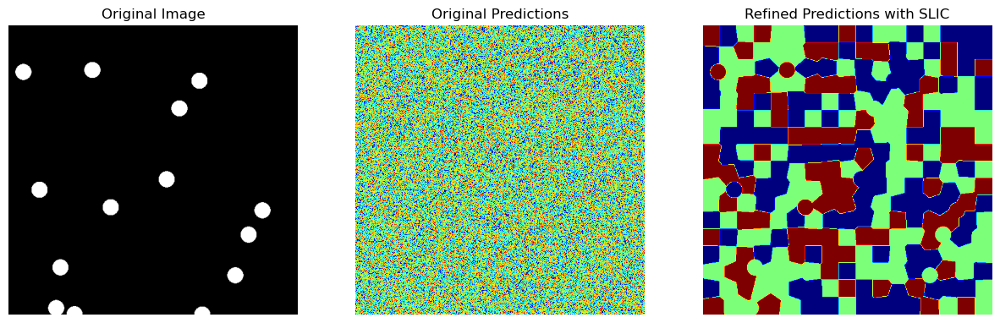

In [1]:
import numpy as np
import cv2
from skimage.segmentation import slic
from skimage.color import label2rgb
import matplotlib.pyplot as plt

# Function to apply SLIC and refine predictions
def slic_refinement(image, predictions, n_segments=200, compactness=10):
    """
    Apply SLIC superpixel segmentation to refine predictions.

    Parameters:
        image (numpy.ndarray): Input image (H, W, C).
        predictions (numpy.ndarray): Model predictions (H, W).
        n_segments (int): Number of superpixels.
        compactness (float): Compactness parameter for SLIC.

    Returns:
        refined_predictions (numpy.ndarray): Refined predictions (H, W).
    """
    # Apply SLIC to generate superpixels
    superpixels = slic(image, n_segments=n_segments, compactness=compactness, start_label=1)
    
    # Refine predictions using superpixels
    refined_predictions = np.zeros_like(predictions)
    for segment in np.unique(superpixels):
        # Mask for the current superpixel
        mask = superpixels == segment
        
        # Assign the most common label within the superpixel to the entire segment
        most_common_label = np.bincount(predictions[mask]).argmax()
        refined_predictions[mask] = most_common_label
    
    return refined_predictions, superpixels

# Example usage
if __name__ == "__main__":
    # Load an example image and model prediction (dummy data)
    image = cv2.imread("../../data/2024-10-30-loc-dataset-1024/u_aug_train_u10/masks/tile_shp_14_10.png")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Simulated model predictions (for demonstration)
    predictions = np.random.randint(0, 3, (image.shape[0], image.shape[1]))  # Random labels (3 classes)

    # Apply SLIC and refine predictions
    refined_predictions, superpixels = slic_refinement(image, predictions, n_segments=300, compactness=20)

    # Visualize results
    superpixel_overlay = label2rgb(superpixels, image, kind='avg')
    
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Original Predictions")
    plt.imshow(predictions, cmap="jet")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Refined Predictions with SLIC")
    plt.imshow(refined_predictions, cmap="jet")
    plt.axis("off")

    plt.show()


In [5]:
import numpy as np
import cv2
from skfuzzy import cmeans
import matplotlib.pyplot as plt

def watershed_segmentation(image):
    """
    Watershed algoritmus.
    """
    # Előfeldolgozás: szűrés
    blurred = cv2.medianBlur(image, 3)

    # Gradiens számítása (Sobel maszk)
    gradient_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = cv2.magnitude(gradient_x, gradient_y).astype(np.uint8)

    # Lokális minimumok keresése
    ret, binary = cv2.threshold(gradient_magnitude, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    kernel = np.ones((5, 5), np.uint8)
    sure_bg = cv2.dilate(binary, kernel, iterations=3)
    sure_fg = cv2.erode(binary, kernel, iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Marker létrehozása
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1  # A háttér legyen 1
    markers[unknown == 255] = 0

    # Watershed alkalmazása
    image_colored = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(image_colored, markers)
    image_colored[markers == -1] = [255, 0, 0]  # Határvonalak pirossal

    return image_colored

def fuzzy_cmeans_segmentation(image, n_clusters=3, fuzziness=5.0, max_iter=300, error=0.005):
    """
    Perform Fuzzy C-Means clustering for image segmentation.

    Parameters:
        image (np.ndarray): Grayscale input image (2D array).
        n_clusters (int): Number of clusters (regions).
        fuzziness (float): Fuzzification parameter (m > 1).
        max_iter (int): Maximum number of iterations.
        error (float): Tolerance for stopping criterion.

    Returns:
        segmented_image (np.ndarray): Segmented image where each pixel is assigned to the most likely cluster.
        membership (np.ndarray): Membership values for each pixel in all clusters.
    """
    # Flatten the image and normalize it
    flat_image = image.flatten() / 255.0
    
    # Reshape for fuzzy c-means
    data = np.expand_dims(flat_image, axis=0)
    
    # Fuzzy C-Means clustering
    cntr, u, _, _, _, _, _ = cmeans(
        data=data,
        c=n_clusters,
        m=fuzziness,
        error=error,
        maxiter=max_iter,
        init=None
    )
    
    # Determine the most likely cluster for each pixel
    cluster_labels = np.argmax(u, axis=0)
    segmented_image = cluster_labels.reshape(image.shape)
    
    return segmented_image, u

# Load a grayscale image
image_path = '../../data/2024-11-13-seg-dataset-1024/u_aug_train/images/tile_150.png'
image = in_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
_, image = cv2.threshold(image, 120, 50, cv2.THRESH_TRUNC)
#image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


#image, regions = split_merge(image, threshold=5)
#_, image = cv2.threshold(image, 110, 0, cv2.THRESH_BINARY)

# Perform fuzzy C-means clustering
image = watershed_segmentation(image)


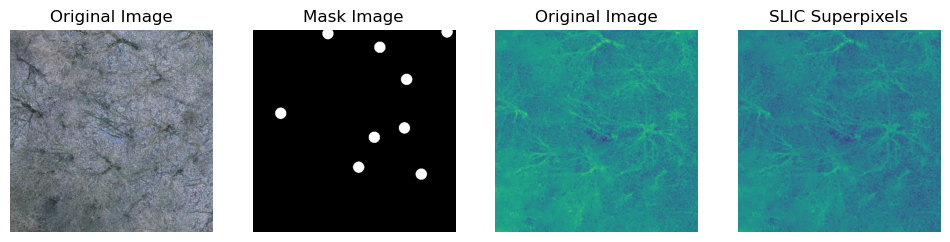

In [1]:
import cv2
import numpy as np
from skimage.segmentation import slic
from skimage.color import label2rgb
import matplotlib.pyplot as plt

def shadow_boosting_with_slic(image):
    image = shadow_boosting(image)

    image = cv2.GaussianBlur(image, (7, 7), 0)
    image = cv2.medianBlur(image, 3)
    image = cv2.GaussianBlur(image, (7, 7), 0)
    image = cv2.medianBlur(image, 3)
    image = cv2.GaussianBlur(image, (7, 7), 0)
    image = cv2.medianBlur(image, 3)

    n_segments = 1000
    compactness = 10
    superpixels = slic(image, n_segments=n_segments, compactness=compactness, start_label=1)
    return label2rgb(superpixels, image, kind='avg')

def desaturation(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower_green = np.array([65, 255, 255])  #adjust needed
    upper_green = np.array([85, 255, 255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)

    #desaturate areas outside of the green mask
    hsv[:, :, 1] = cv2.bitwise_and(hsv[:, :, 1], green_mask)

    return cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

def shadow_boosting(image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    if len(image.shape) == 3:
        return cv2.merge([clahe.apply(channel) for channel in cv2.split(image)])
    else:
        return clahe.apply(image) #grayscale  

def NDVI(image):
    green = image[:, :, 1].astype(float)
    red = image[:, :, 2].astype(float)

    # Calculate NDVI
    ndvi = (green - red) / (green + red + 1e-5)  # Adding small value to avoid division by zero

    return cv2.normalize(ndvi, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def VARI(image):
    blue = image[:, :, 0].astype(float)
    green = image[:, :, 1].astype(float)
    red = image[:, :, 2].astype(float)

    # Calculate NDVI
    ndvi = (green - red) / (green + red - blue + 1e-5)  # Adding small value to avoid division by zero

    return cv2.normalize(ndvi, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Load an example image
image = cv2.imread("../../data/2024-10-30-loc-dataset-1024/u_aug_train_u10/images/tile_tif_7_5.png")
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization
#image = desaturation(image)
#clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

#image = cv2.merge([cv2.split(image)[0],cv2.split(image)[1],clahe.apply(cv2.split(image)[2])])

#out_image = NDVI(image)

#image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB) 
#image = cv2.GaussianBlur(image, (7, 7), 0)
#image = cv2.medianBlur(image, 3)
#image = cv2.GaussianBlur(image, (7, 7), 0)
#image = cv2.medianBlur(image, 3)
#image = cv2.GaussianBlur(image, (7, 7), 0)
#image = cv2.medianBlur(image, 3)
#
#n_segments = 1000  # Number of superpixels
#compactness = 10  # Compactness of the superpixels
#superpixels = slic(image, n_segments=n_segments, compactness=compactness, start_label=1)
#out_image = label2rgb(superpixels, image, kind='avg')  # Overlay superpixels on the image
#
#out_image = cv2.cvtColor(out_image, cv2.COLOR_RGB2GRAY)

# Plot the results
plt.figure(figsize=(12, 8))
plt.subplot(1, 4, 1)
plt.title("Original Image")
plt.imshow(cv2.imread("../../data/2024-10-30-loc-dataset-1024/u_aug_train_u10/images/tile_tif_7_5.png"))
plt.axis("off")

plt.subplot(1, 4, 2)
plt.title("Mask Image")
plt.imshow(cv2.imread("../../data/2024-10-30-loc-dataset-1024/u_aug_train_u10/masks/tile_shp_7_5.png"))
plt.axis("off")

plt.subplot(1, 4, 3)
plt.title("Original Image")
plt.imshow(NDVI(image))
plt.axis("off")

plt.subplot(1, 4, 4)
plt.title("SLIC Superpixels")
plt.imshow(VARI(image))
plt.axis("off")

plt.show()


#plt.figure(figsize=(12, 12))
#plt.title("Original Image")
#plt.imshow(cv2.merge([clahe.apply(cv2.split(image)[0]),cv2.split(image)[1],cv2.split(image)[2]]))
#plt.axis("off")
#plt.figure(figsize=(12, 12))
#plt.title("Original Image")
#plt.imshow(cv2.merge([cv2.split(image)[0],clahe.apply(cv2.split(image)[1]),cv2.split(image)[2]]))
#plt.axis("off")
#plt.figure(figsize=(12, 12))
#plt.title("Original Image")
#plt.imshow(cv2.merge([cv2.split(image)[0],cv2.split(image)[1],clahe.apply(cv2.split(image)[2])]))
#plt.axis("off")
#plt.figure(figsize=(12, 12))
#plt.title("Original Image")
#plt.imshow(cv2.merge([clahe.apply(cv2.split(image)[0]),clahe.apply(cv2.split(image)[1]),cv2.split(image)[2]]))
#plt.axis("off")
#plt.figure(figsize=(12, 12))
#plt.title("Original Image")
#plt.imshow(cv2.merge([clahe.apply(cv2.split(image)[0]),cv2.split(image)[1],clahe.apply(cv2.split(image)[2])]))
#plt.axis("off")
#plt.figure(figsize=(12, 12))
#plt.title("Original Image")
#plt.imshow(cv2.merge([cv2.split(image)[0],clahe.apply(cv2.split(image)[1]),clahe.apply(cv2.split(image)[2])]))
#plt.axis("off")
#
#plt.show()
#

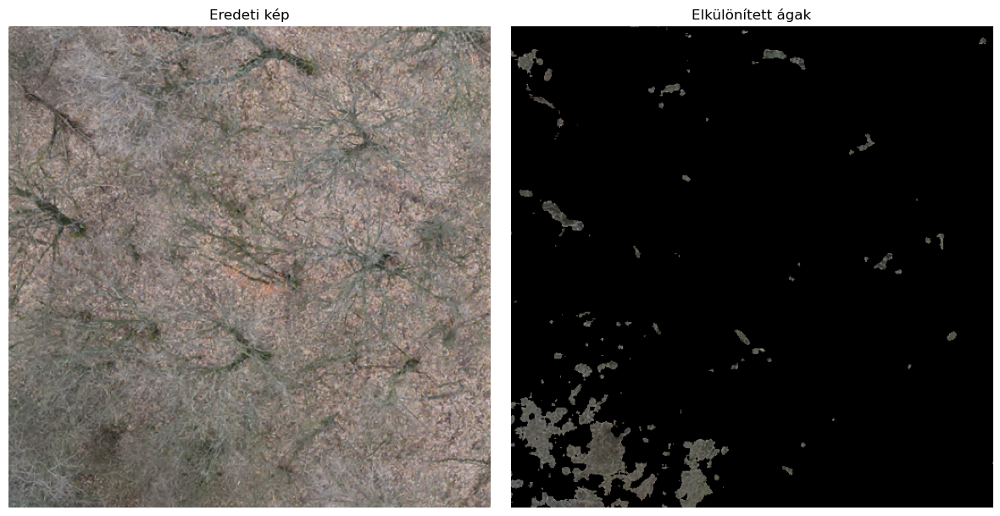

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def extract_branches_by_color(image_path):
    # Kép betöltése
    image = cv2.imread(image_path)
    if image is None:
        print("Nem sikerült betölteni a képet.")
        return None
    

    # Kép átalakítása HSV színtérbe
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Alsó és felső küszöbérték meghatározása az ágak színprofiljának elkülönítéséhez
    # Ezek az értékek változtathatók, attól függően, hogy milyen a kép jellemző színe
    #lower_bound = np.array([0, 10, 50])     # alsó határérték (árnyalat, telítettség, fényesség)
    #upper_bound = np.array([30, 150, 200])
    lower_bound = np.array([0, 0, 0])        # Lower bound (hue, saturation, value)
    upper_bound = np.array([180, 50, 100])   # Upper bound (hue, saturation, value)
    
    # Maszk létrehozása a meghatározott színű képrészekről
    mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
    
    mask = cv2.medianBlur(mask, 7)
    
    # Az eredeti képen a maszk alkalmazása
    result = cv2.bitwise_and(image, image, mask=mask)
    
    #result = cv2.GaussianBlur(result, (7, 7), 0)
    #result = cv2.medianBlur(result, 7)
    #result = cv2.GaussianBlur(result, (7, 7), 0)
    #result = cv2.medianBlur(result, 3)
    #result = cv2.GaussianBlur(result, (7, 7), 0)
    #result = cv2.medianBlur(result, 3)
    
    # OpenCV képeket RGB-re konvertálás a matplotlib megjelenítéshez
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    
    
    # Eredmény megjelenítése matplotlib használatával
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(image_rgb)
    ax[0].set_title('Eredeti kép')
    ax[0].axis('off')
    
    ax[1].imshow(result_rgb)
    ax[1].set_title('Elkülönített ágak')
    ax[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return result

# Függvény hívása
extract_branches_by_color("../../data/2024-10-30-loc-dataset-1024/u_aug_train_u10/images/tile_tif_7_5.png")

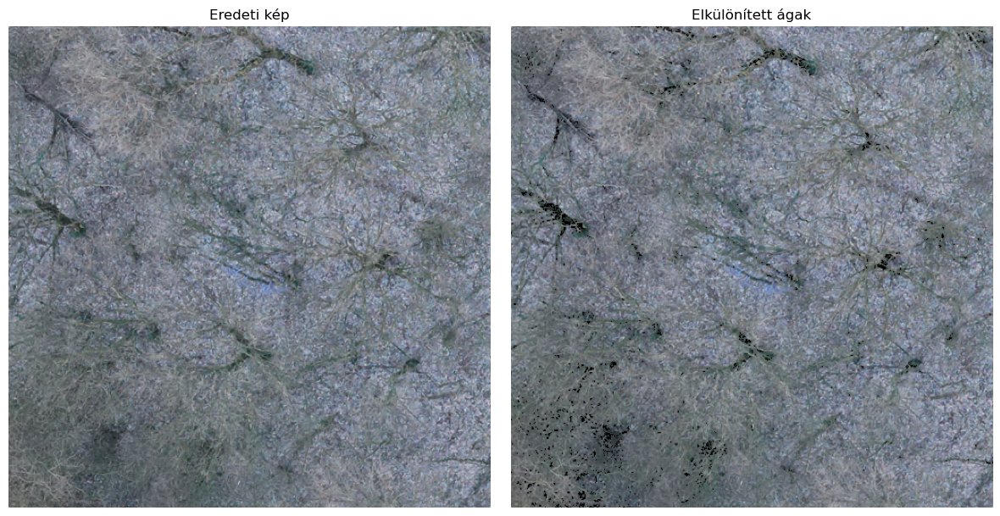

In [25]:
import cv2
import numpy as np

# Convert image to HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define lower and upper thresholds to isolate the color profile of the branches
# Adjusted values to better match the typical dark RGB values (under 100, 100, 100)
lower_bound = np.array([0, 0, 0])        # Lower bound (hue, saturation, value)
upper_bound = np.array([100, 40, 80])   # Upper bound (hue, saturation, value)

# Create a mask using the adjusted HSV thresholds
mask = cv2.inRange(hsv_image, lower_bound, upper_bound)

# Invert the mask to filter out the branches
inverted_mask = cv2.bitwise_not(mask)
mask = cv2.medianBlur(mask, 11)
mask = cv2.medianBlur(mask, 5)

# Keep the background as it is and make the branches black
background = cv2.bitwise_and(image, image, mask=inverted_mask)
branches_black = np.zeros_like(image)
branches_black[mask != 0] = [0, 0, 0]


# Combine the background and the black branches
result = cv2.add(background, branches_black)

# Show the result (optional)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image)
ax[0].set_title('Eredeti kép')
ax[0].axis('off')

ax[1].imshow(result)
ax[1].set_title('Elkülönített ágak')
ax[1].axis('off')

plt.tight_layout()
plt.show()


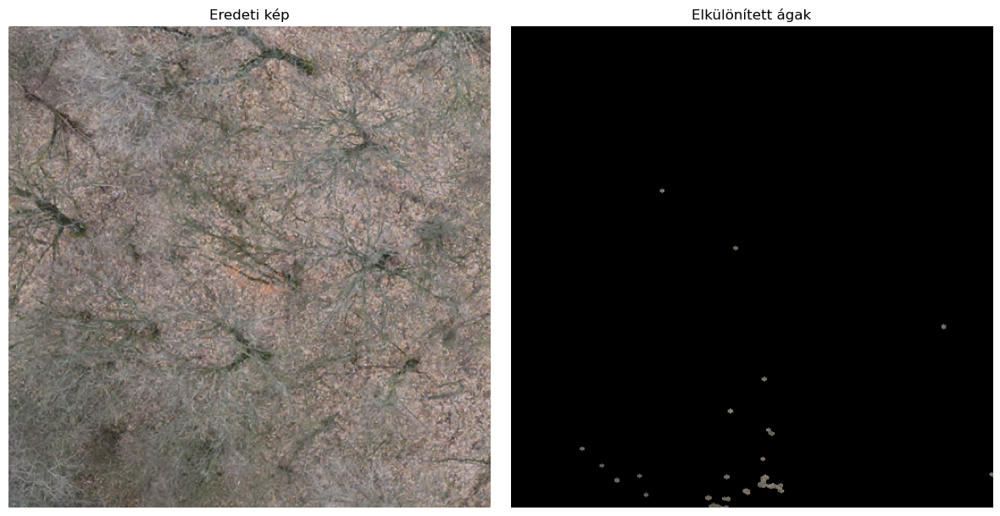

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def extract_branches_by_color(image_path):
    # Kép betöltése
    image = cv2.imread(image_path)
    if image is None:
        print("Nem sikerült betölteni a képet.")
        return None
    
    # Kép átalakítása HSV színtérbe
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Alsó és felső küszöbérték meghatározása az ágak színprofiljának elkülönítéséhez
    # Ezek az értékek változtathatók, attól függően, hogy milyen a kép jellemző színe
    lower_bound = np.array([15, 30, 90])     # alsó határérték (árnyalat, telítettség, fényesség)
    upper_bound = np.array([25, 80, 150])   # felső határérték (árnyalat, telítettség, fényesség)
    
    # Maszk létrehozása a meghatározott színű képrészekről
    mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
    
    # Morfológiai műveletek alkalmazása a zaj csökkentésére
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    
    # Az eredeti képen a maszk alkalmazása
    result = cv2.bitwise_and(image, image, mask=mask)
    
    # OpenCV képeket RGB-re konvertálás a matplotlib megjelenítéshez
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    
    # Eredmény megjelenítése matplotlib használatával
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(image_rgb)
    ax[0].set_title('Eredeti kép')
    ax[0].axis('off')
    
    ax[1].imshow(result_rgb)
    ax[1].set_title('Elkülönített ágak')
    ax[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return result

# Függvény hívása
extract_branches_by_color("../../data/2024-10-30-loc-dataset-1024/u_aug_train_u10/images/tile_tif_7_5.png")
